# Background

- Finished pole-to-pole measurements 07-06-22
- Now running angular scans of a Hall probe in the magnet.
- Running at a high enough current that only high field NMR is needed. For now, it is taped directly to the pole to keep it out of the way.
- Used knowledge of technical details of rotation and approximate limits from last year.

# Imports

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [63]:
import numpy as np
import pandas as pd
import pickle as pkl
from datetime import datetime
from datetime import timedelta
from pandas.api.types import is_numeric_dtype
from scipy.interpolate import interp1d
from scipy.spatial.transform import Rotation
import lmfit as lm
from copy import deepcopy
#from dateutil import parser
from plotly import graph_objects as go
from plotly.offline import plot
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
%matplotlib inline

# local imports
from plotting import config_plots, datetime_plt, get_label
from load_slow import *
from Zaber_Magnet_Convert import *
# hallprobecalib package
from hallprobecalib.hpcplots import scatter3d, scatter2d, histo, spherical_scatter3d
from mu2e.mu2eplots import mu2e_plot3d
# V vs. B, T (2021 results)
from V_vs_B_T import V_forward, inv_B_v2, invert_row, calc_B_column

# from pandas.api.types import is_numeric_dtype
# from dateutil import parser

config_plots()
# plt.rcParams.update({"text.usetex": True})

In [64]:
ddir = '/home/ckampa/Dropbox/LogFiles/temp_rotate_07-06-22/'

In [65]:
# 7-6-22 14:05, probe ##, rotating in magnet, coarse scan
# PGC @ 15 deg C
# 2 deg steps -10 -- +6 angle 0 (theta)
# 45 deg steps full 360 deg, centered on -16 deg angle 1 (phi)
######
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-06_14:05/'
# scanfile = ddir+'2022-07-06 140532.txt'
# slowfile = ddir+'2022-07-06 133626slow.txt'

In [66]:
# 7-6-22 14:05, probe ##, rotating in magnet, fine scan
# PGC @ 15 deg C
# 1 deg steps -10 -- +6 angle 0 (theta)
# 2 deg steps full 360 deg, centered on 0 deg angle 1 (phi)
######
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-06_16:02/'
# scanfile = ddir+'2022-07-06 160256.txt'
# slowfile = ddir+'2022-07-06 133626slow.txt'

In [67]:
# 7-7-22 12:04, probe ##, rotating in magnet, finer scan
# PGC @ 15 deg C
# 0.25 deg steps -10 -- +6 angle 0 (theta)
# 1 deg steps full 360 deg, centered on 0 deg angle 1 (phi)
######
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-07_12:04/'
scanfile = ddir+'2022-07-07 120406.txt'
slowfile = ddir+'2022-07-06 133626slow.txt'

In [68]:
# 7-11-22 16:47, probe ##, rotating in magnet, fine scan
# PGC @ 20 deg C, to be in range with V vs. B, T measurements (2021)
# 1 deg steps -10 -- +6 angle 0 (theta)
# 2 deg steps full 360 deg, centered on 0 deg angle 1 (phi)
######
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-11_16:47/'
# scanfile = ddir+'2022-07-11 164742.txt'
# slowfile = ddir+'2022-07-06 133626slow.txt'

# Load Data

In [69]:
# temperature
df_temp = load_data(slowfile)

In [70]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-06 13:36:27,7/6/2022 1:36:27 PM,179.684107,21.064933,26.058136,24.529930,8.465636,11.372712,9.641994,11.906671,14.408076,...,11.894193,33.455921,8.493699,18.744846,31.950731,0.999926,0.0,0.0,0.000000,0.000000
2022-07-06 13:37:01,7/6/2022 1:37:01 PM,179.683993,21.069850,26.077494,24.556576,8.457240,11.507276,9.782500,11.957410,14.409115,...,12.148027,32.744980,7.772305,18.800713,31.951107,0.999926,0.0,34.0,0.009444,0.000394
2022-07-06 13:42:00,7/6/2022 1:42:00 PM,179.683937,21.068050,26.060064,24.530973,8.628462,11.500773,9.719735,12.027719,14.458754,...,11.846492,33.879250,8.470333,18.791918,32.026112,0.999922,0.0,333.0,0.092500,0.003854
2022-07-06 13:47:01,7/6/2022 1:47:01 PM,179.684107,21.066033,26.097599,24.536558,8.293914,11.251393,9.480843,11.766567,14.519392,...,11.590642,29.186279,8.289335,18.828215,32.095150,0.999917,0.0,634.0,0.176111,0.007338
2022-07-06 13:52:00,7/6/2022 1:52:00 PM,179.684050,21.065250,26.068542,24.562454,7.937661,10.974496,9.200842,11.499088,14.569406,...,11.323471,29.215639,7.928405,18.730772,32.097099,0.999917,0.0,933.0,0.259167,0.010799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-17 02:32:05,7/17/2022 2:32:05 AM,179.684730,21.144367,28.892998,27.390463,8.438943,12.238717,11.234059,12.342556,24.140970,...,11.828959,28.214678,8.170964,17.704769,32.573532,0.999424,0.0,910538.0,252.927222,10.538634
2022-07-17 02:37:05,7/17/2022 2:37:05 AM,179.684730,21.143233,28.922865,27.414926,8.122181,12.040179,10.963019,12.076207,24.146219,...,11.574677,29.140263,7.824389,17.739757,32.527943,0.999424,0.0,910838.0,253.010556,10.542106
2022-07-17 02:42:05,7/17/2022 2:42:05 AM,179.684673,21.143317,28.923752,27.428408,7.717012,11.748957,10.627849,11.752561,24.142445,...,11.288489,28.763899,7.380715,17.768429,32.568390,0.999424,0.0,911138.0,253.093889,10.545579


<AxesSubplot:xlabel='Datetime'>

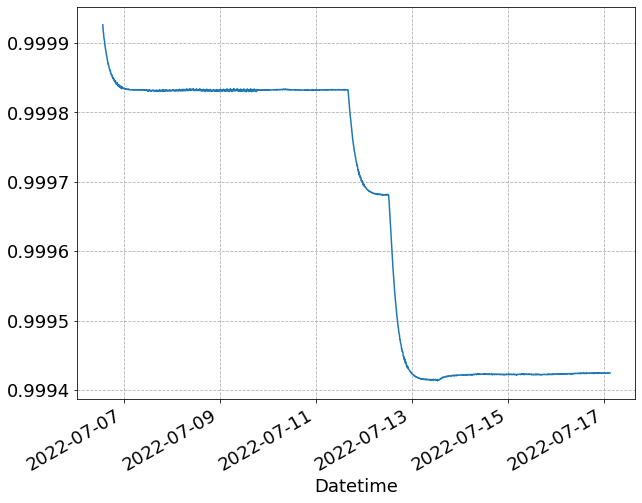

In [71]:
df_temp['NMR [T]'].plot()

In [72]:
df_temp['NMR [T]']

Datetime
2022-07-06 13:36:27    0.999926
2022-07-06 13:37:01    0.999926
2022-07-06 13:42:00    0.999922
2022-07-06 13:47:01    0.999917
2022-07-06 13:52:00    0.999917
                         ...   
2022-07-17 02:32:05    0.999424
2022-07-17 02:37:05    0.999424
2022-07-17 02:42:05    0.999424
2022-07-17 02:47:05    0.999424
2022-07-17 02:52:05    0.999424
Name: NMR [T], Length: 3041, dtype: float64

In [73]:
len(df_temp)

3041

In [74]:
df_temp.tail()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-17 02:32:05,7/17/2022 2:32:05 AM,179.684730,21.144367,28.892998,27.390463,8.438943,12.238717,11.234059,12.342556,24.140970,...,11.828959,28.214678,8.170964,17.704769,32.573532,0.999424,0.0,910538.0,252.927222,10.538634
2022-07-17 02:37:05,7/17/2022 2:37:05 AM,179.684730,21.143233,28.922865,27.414926,8.122181,12.040179,10.963019,12.076207,24.146219,...,11.574677,29.140263,7.824389,17.739757,32.527943,0.999424,0.0,910838.0,253.010556,10.542106
2022-07-17 02:42:05,7/17/2022 2:42:05 AM,179.684673,21.143317,28.923752,27.428408,7.717012,11.748957,10.627849,11.752561,24.142445,...,11.288489,28.763899,7.380715,17.768429,32.568390,0.999424,0.0,911138.0,253.093889,10.545579
2022-07-17 02:47:05,7/17/2022 2:47:05 AM,179.684730,21.143767,28.902409,27.429804,7.372734,11.464889,10.360069,11.486944,24.147024,...,11.078942,29.380831,7.013623,17.718447,32.587448,0.999424,0.0,911438.0,253.177222,10.549051
2022-07-17 02:52:05,7/17/2022 2:52:05 AM,179.684843,21.145550,28.943638,27.453913,7.015521,11.335673,10.230328,11.211184,24.147005,...,10.859303,30.258755,6.590104,17.768349,32.588966,0.999424,0.0,911738.0,253.260556,10.552523


In [75]:
df = load_data(scanfile).iloc[1:]

In [76]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],2F0000000D5EC73A_Raw_X,2F0000000D5EC73A_Raw_Y,2F0000000D5EC73A_Raw_Z,2F0000000D5EC73A_Raw_T,2F0000000D5EC73A_Cal_X,...,2F0000000D5EC73A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-07 12:04:50,7/7/2022 12:04:50 PM,179.683880,21.077967,0.0,0.0,-84990.0,-387985.0,-2762867.0,16130.0,0.988046,...,16.130,-8.0,-180.0,350.116691,-1.0,179.999978,-1.0,43.0,0.011944,0.000498
2022-07-07 12:04:58,7/7/2022 12:04:58 PM,179.683880,21.078583,0.0,0.0,-91381.0,-385666.0,-2762948.0,16136.0,0.988047,...,16.136,-8.0,-179.0,350.116676,-1.0,181.000018,-1.0,51.0,0.014167,0.000590
2022-07-07 12:05:06,7/7/2022 12:05:06 PM,179.683937,21.079183,0.0,0.0,-97593.0,-383344.0,-2762920.0,16145.0,0.988012,...,16.145,-8.0,-178.0,350.116701,-1.0,182.000021,-1.0,59.0,0.016389,0.000683
2022-07-07 12:05:13,7/7/2022 12:05:13 PM,179.683880,21.079750,0.0,0.0,-103787.0,-380855.0,-2762979.0,16151.0,0.988005,...,16.151,-8.0,-177.0,350.116714,-1.0,183.000011,-1.0,66.0,0.018333,0.000764
2022-07-07 12:05:21,7/7/2022 12:05:21 PM,179.683937,21.080150,0.0,0.0,-110017.0,-378333.0,-2763098.0,16156.0,0.988018,...,16.156,-8.0,-176.0,350.116708,-1.0,184.000017,-1.0,74.0,0.020556,0.000856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-09 18:48:07,7/9/2022 6:48:07 PM,179.684220,21.066800,0.0,0.0,172498.0,320694.0,-2783636.0,16081.0,0.992154,...,16.081,8.0,176.0,5.999997,0.0,176.000007,0.0,197040.0,54.733333,2.280556
2022-07-09 18:48:14,7/9/2022 6:48:14 PM,179.684277,21.066850,0.0,0.0,178483.0,317871.0,-2783618.0,16086.0,0.992179,...,16.086,8.0,177.0,6.000026,0.0,177.000007,0.0,197047.0,54.735278,2.280637
2022-07-09 18:48:22,7/9/2022 6:48:22 PM,179.684220,21.066933,0.0,0.0,184386.0,314935.0,-2783514.0,16074.0,0.992168,...,16.074,8.0,178.0,6.000023,0.0,177.999997,0.0,197055.0,54.737500,2.280729


<AxesSubplot:xlabel='Datetime'>

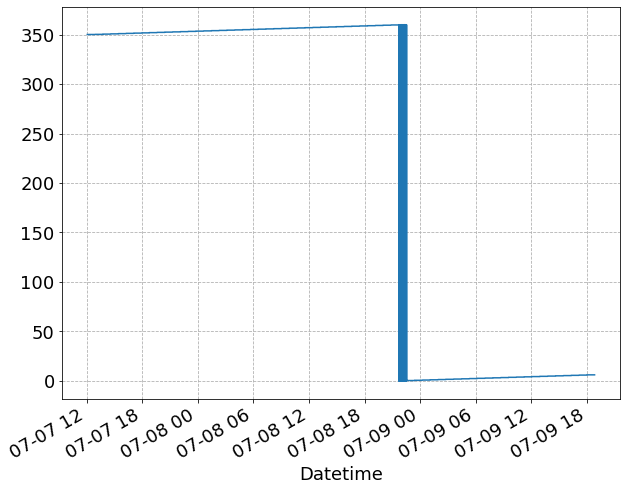

In [104]:
df.SmarAct_Meas_Angle_1.plot()

<AxesSubplot:xlabel='Datetime'>

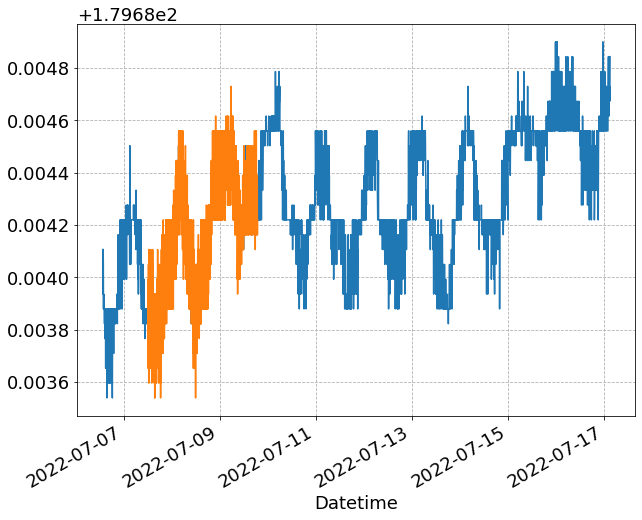

In [77]:
df_temp['Magnet Current [A]'].plot()
df['Magnet Current [A]'].plot()

In [78]:
df.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', '2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Raw_Y',
       '2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Raw_T',
       '2F0000000D5EC73A_Cal_X', '2F0000000D5EC73A_Cal_Y',
       '2F0000000D5EC73A_Cal_Z', '2F0000000D5EC73A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta'],
      dtype='object')

In [79]:
def get_probe_IDs(df):
    probes = [c[:-6] for c in df.columns if "Raw_X" in c]
    return sorted(probes)

In [80]:
probes = get_probe_IDs(df)
probe = probes[0]

In [81]:
probes, probe

(['2F0000000D5EC73A'], '2F0000000D5EC73A')

In [82]:
# Hall probe calculations
for p in probes:
    for t in ['Raw', 'Cal']:
        df[f'{p}_{t}_Bmag'] = (df[f'{p}_{t}_X']**2 + df[f'{p}_{t}_Y']**2 + df[f'{p}_{t}_Z']**2)**(1/2)
        df[f'{p}_{t}_Theta'] = np.arccos(df[f'{p}_{t}_Z']/df[f'{p}_{t}_Bmag'])
        df[f'{p}_{t}_Phi'] = np.arctan2(df[f'{p}_{t}_Y'],df[f'{p}_{t}_X'])
# again using theta redefining Cal components
for p in probes:
    for t in ['Cal']:
        df[f'{p}_{t}_Theta2'] = np.arccos(df[f'{p}_{t}_X']/df[f'{p}_{t}_Bmag'])
        df[f'{p}_{t}_Phi2'] = np.arctan2(df[f'{p}_{t}_Z'],df[f'{p}_{t}_Y'])

In [83]:
df['Magnet Resistance [Ohm]'] = df['Magnet Voltage [V]'] / df['Magnet Current [A]']
df['Coil Resistance [Ohm]'] = 2*df['Magnet Resistance [Ohm]']
df['Magnet Power [W]'] = df['Magnet Voltage [V]'] * df['Magnet Current [A]']

In [84]:
df[['Magnet Power [W]', 'Coil Resistance [Ohm]']]

,Magnet Power [W],Coil Resistance [Ohm]
Datetime,,
2022-07-07 12:04:50,3787.370833,0.234612
2022-07-07 12:04:58,3787.481638,0.234619
2022-07-07 12:05:06,3787.590643,0.234625
2022-07-07 12:05:13,3787.691269,0.234632
2022-07-07 12:05:21,3787.764338,0.234636
...,...,...
2022-07-09 18:48:07,3785.371526,0.234487
2022-07-09 18:48:14,3785.381704,0.234487
2022-07-09 18:48:22,3785.395484,0.234488


In [85]:
t0 = df.index[0]
tf = df.index[-1]

In [86]:
t0, tf

(Timestamp('2022-07-07 12:04:50'), Timestamp('2022-07-09 18:48:38'))

In [87]:
df_t = df_temp.query(f'"{t0}" <= Datetime <= "{tf}"').copy()

In [88]:
df_t

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-07-07 12:07:03,7/7/2022 12:07:03 PM,179.683823,21.076333,26.202082,24.673046,6.521139,9.986544,7.233150,10.426664,15.932531,...,10.479848,30.423721,6.384603,18.297808,32.620407,0.999832,0.0,81036.0,22.510000,0.937917
2022-07-07 12:12:03,7/7/2022 12:12:03 PM,179.683880,21.078400,26.198442,24.709051,6.384720,10.009138,7.185710,10.339764,15.936610,...,10.783925,31.274315,6.040265,18.325209,32.621765,0.999831,0.0,81336.0,22.593333,0.941389
2022-07-07 12:17:03,7/7/2022 12:17:03 PM,179.683880,21.080250,26.222877,24.711410,7.005603,10.591073,7.784220,10.900702,15.935767,...,11.487394,31.836945,6.106501,18.377869,32.606373,0.999831,0.0,81636.0,22.676667,0.944861
2022-07-07 12:22:03,7/7/2022 12:22:03 PM,179.683880,21.080467,26.185261,24.682249,7.945996,11.255135,8.563878,11.628212,15.933943,...,12.074346,32.515247,7.059671,18.371607,32.610413,0.999832,0.0,81936.0,22.760000,0.948333
2022-07-07 12:27:03,7/7/2022 12:27:03 PM,179.683880,21.079083,26.167950,24.662447,8.673299,11.682805,9.128124,12.160546,15.939552,...,12.182293,32.883438,8.089366,18.290703,32.616386,0.999831,0.0,82236.0,22.843333,0.951806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-09 18:27:04,7/9/2022 6:27:04 PM,179.684220,21.068217,26.110544,24.564087,8.175622,11.312326,9.525085,11.732266,15.929981,...,11.476092,28.512703,8.177090,18.306189,32.325878,0.999831,0.0,276637.0,76.843611,3.201817
2022-07-09 18:32:04,7/9/2022 6:32:04 PM,179.684220,21.067517,26.124727,24.552584,7.845795,11.049525,9.351840,11.482889,15.927117,...,11.230319,29.220245,7.826111,18.290075,32.227726,0.999832,0.0,276937.0,76.926944,3.205289
2022-07-09 18:37:04,7/9/2022 6:37:04 PM,179.684277,21.067100,26.133797,24.563242,7.396679,10.724196,9.060145,11.161573,15.930570,...,10.930471,29.437111,7.390028,18.352137,32.327789,0.999833,0.0,277237.0,77.010278,3.208762


In [89]:
df_t['NMR [T]']

Datetime
2022-07-07 12:07:03    0.999832
2022-07-07 12:12:03    0.999831
2022-07-07 12:17:03    0.999831
2022-07-07 12:22:03    0.999832
2022-07-07 12:27:03    0.999831
                         ...   
2022-07-09 18:27:04    0.999831
2022-07-09 18:32:04    0.999832
2022-07-09 18:37:04    0.999833
2022-07-09 18:42:04    0.999833
2022-07-09 18:47:04    0.999833
Name: NMR [T], Length: 657, dtype: float64

In [90]:
probe

'2F0000000D5EC73A'

<AxesSubplot:xlabel='Datetime'>

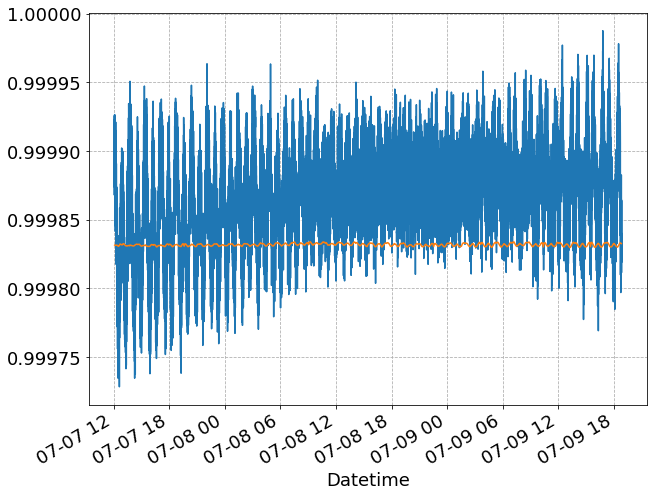

In [91]:
df[f'{probe}_Cal_Bmag'].plot()
df_t['NMR [T]'].plot()

In [92]:
len(df_t), len(df_temp)

(657, 3041)

In [93]:
df[f'{probe}_Cal_Bmag'].mean() - df_t['NMR [T]'].mean()

3.474516382195869e-05

In [94]:
df_t['NMR [T]'].mean()

0.9998317971613394

In [95]:
df['Magnet Current [A]'].mean()

179.6841544366825

In [96]:
# value @ Hall probe, estimated from pole-to-pole data
0.99973 *  df_t['NMR [T]'].mean()

0.9995618425761058

In [97]:
df[f'{probe}_Cal_Bmag'].mean() - 0.99973 *  df_t['NMR [T]'].mean()

0.0003046997490555592

# Basic Plotting
- All variables vs. time
- Look at relationship between SmarAct motors and measured angles.

/tmp/ipykernel_3290528/2936248105.py:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



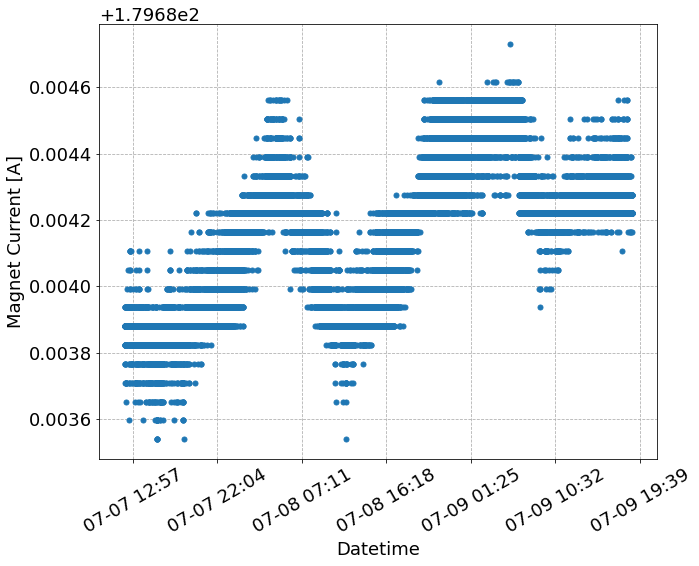

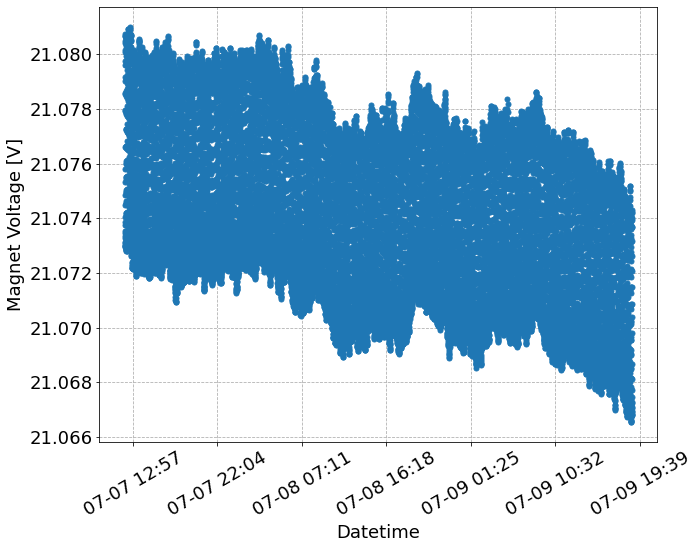

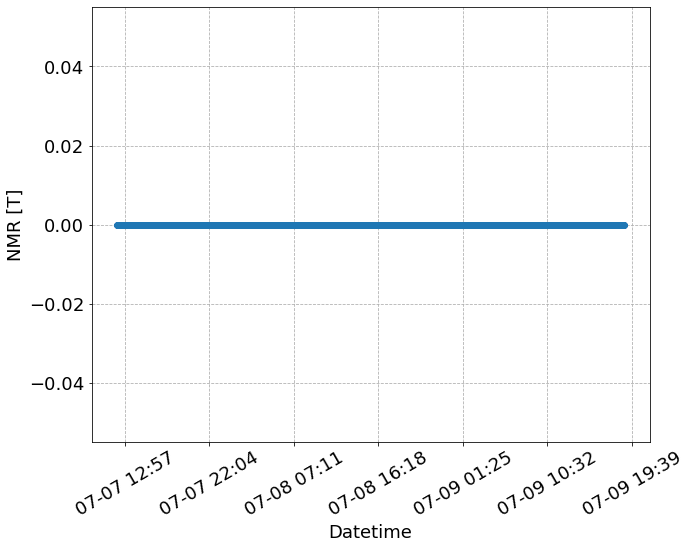

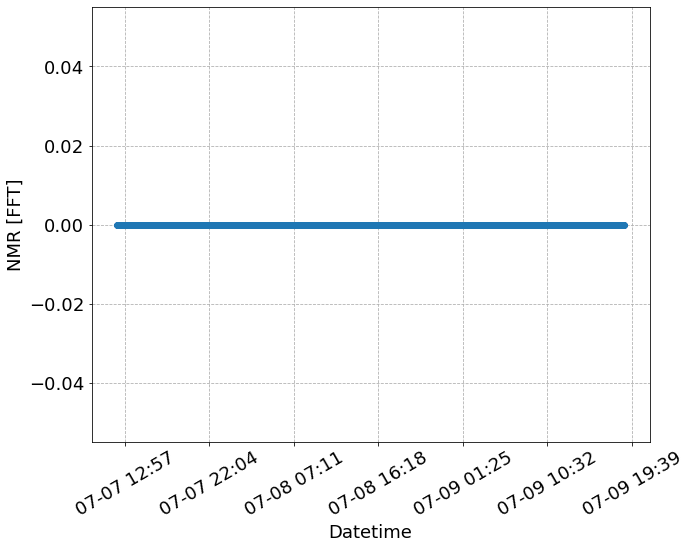

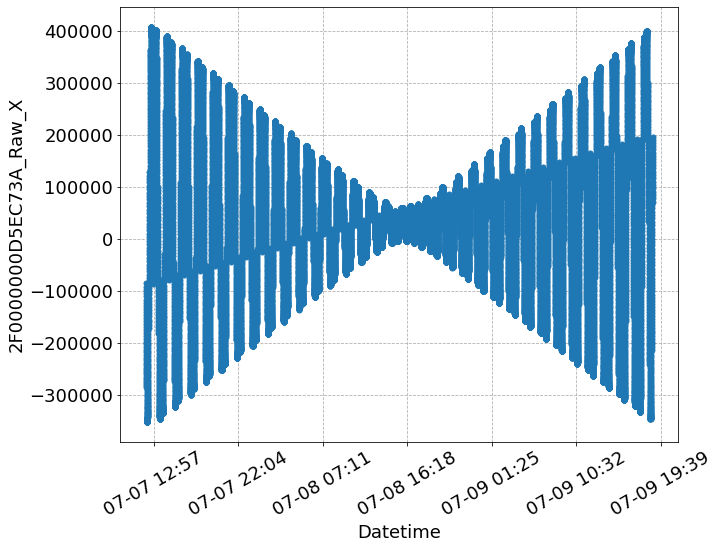

...

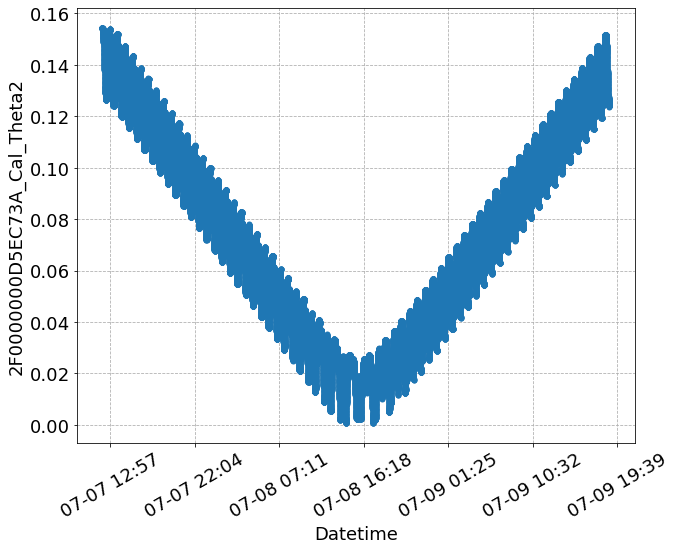

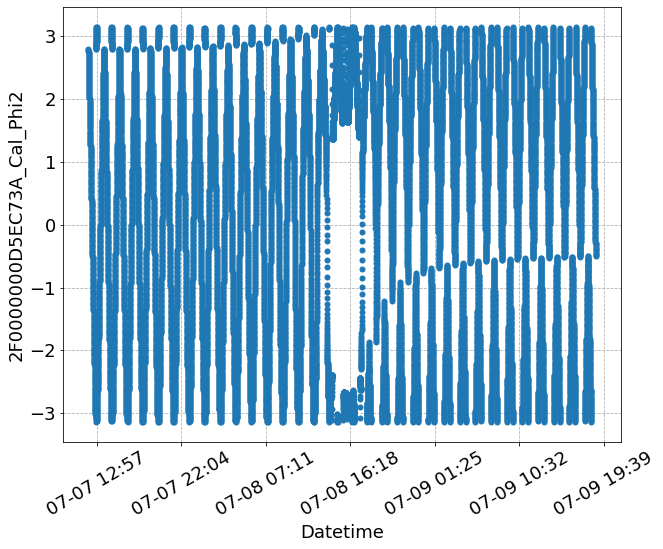

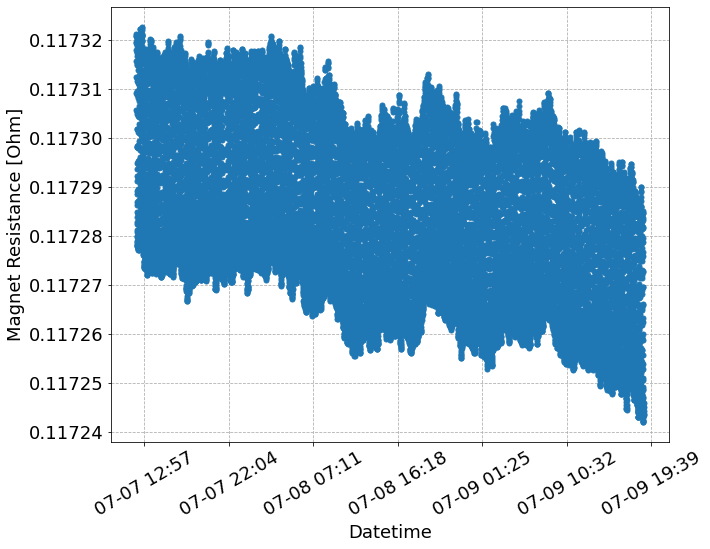

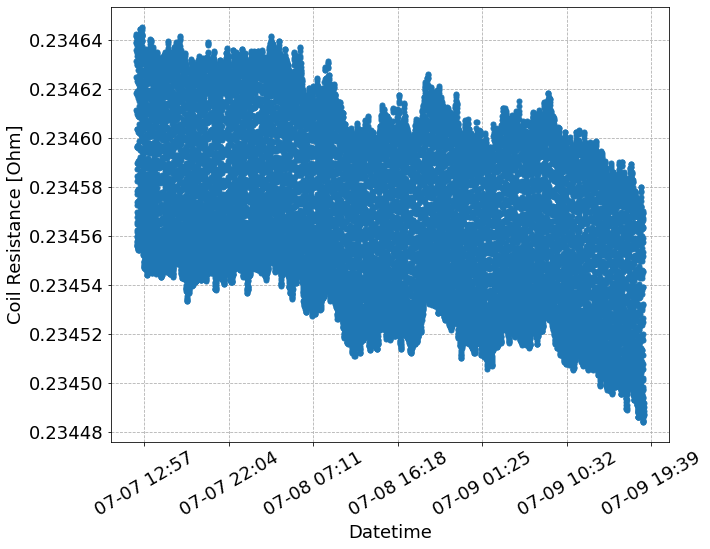

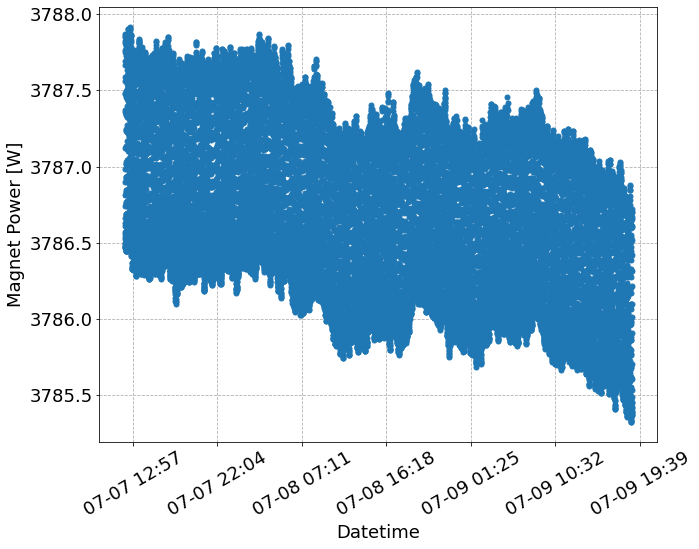

In [98]:
# plot vs. time
for col in df.columns:
    if is_numeric_dtype(df[col]):
        fig, ax = plt.subplots()
        ax = datetime_plt(ax, df.index, df[col], nmaj=6, Locator='Minute')
        ax.set_xlabel('Datetime')
        ax.set_ylabel(col)

/tmp/ipykernel_3290528/1916587146.py:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



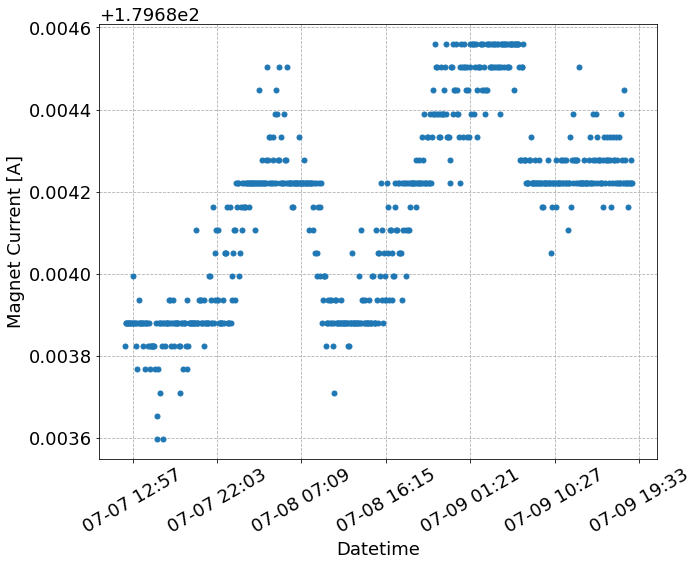

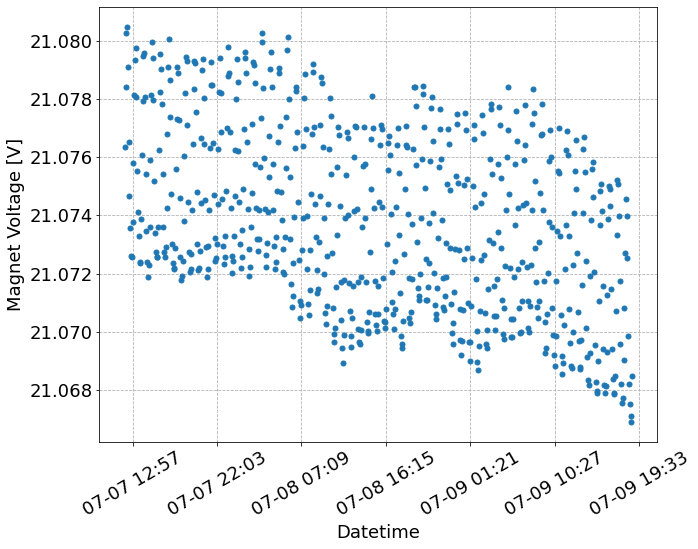

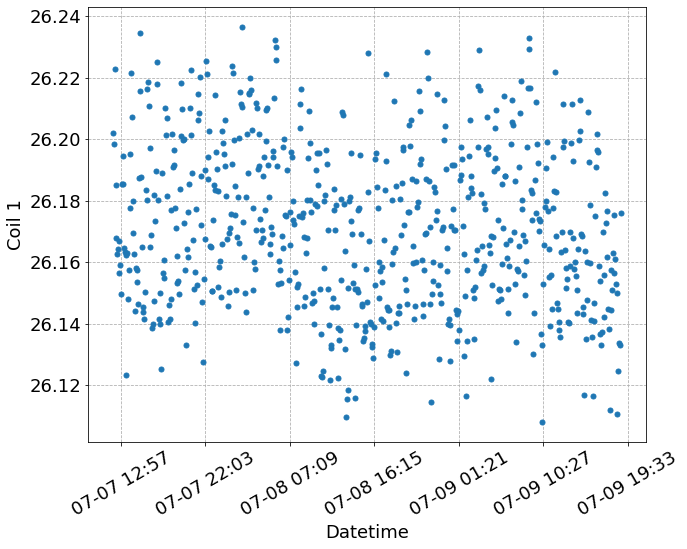

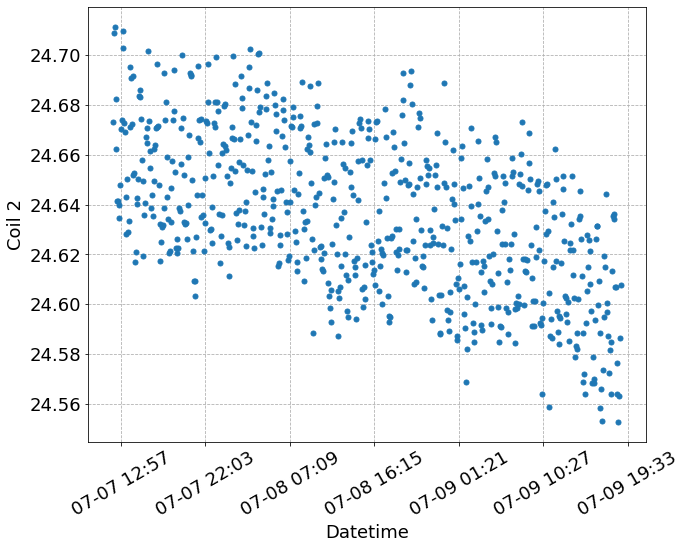

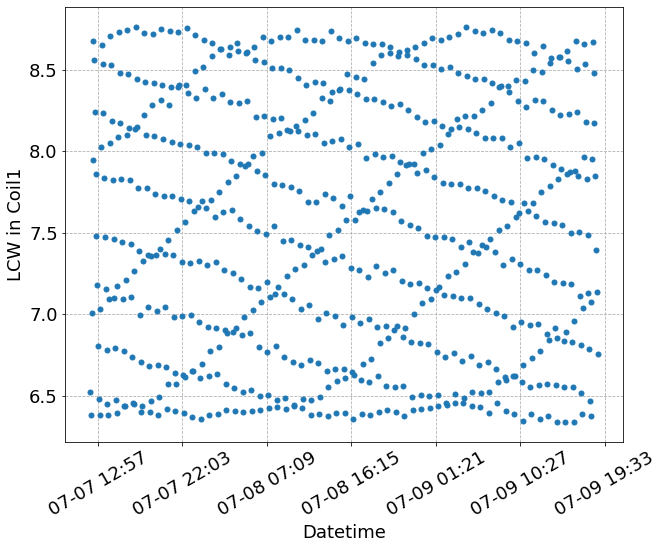

...

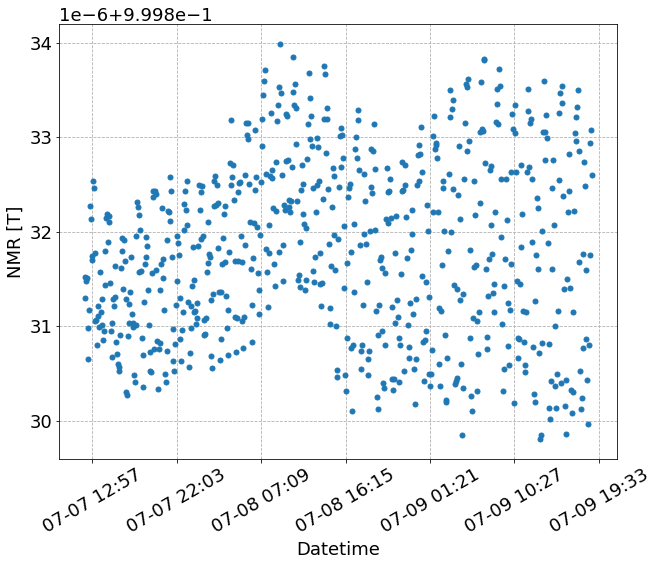

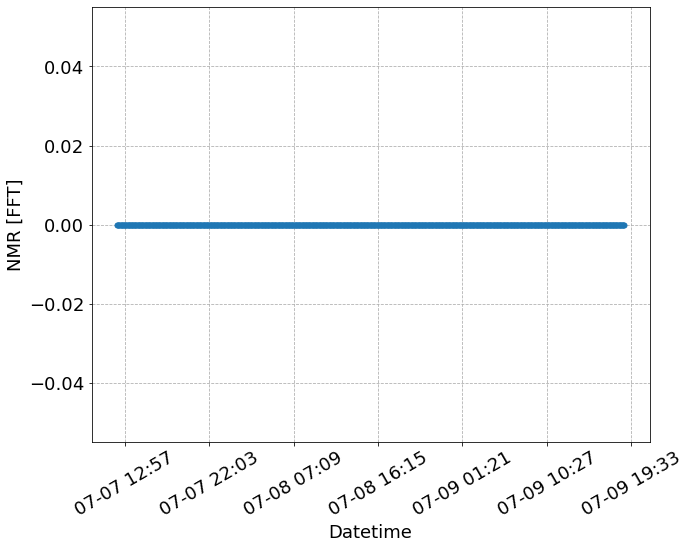

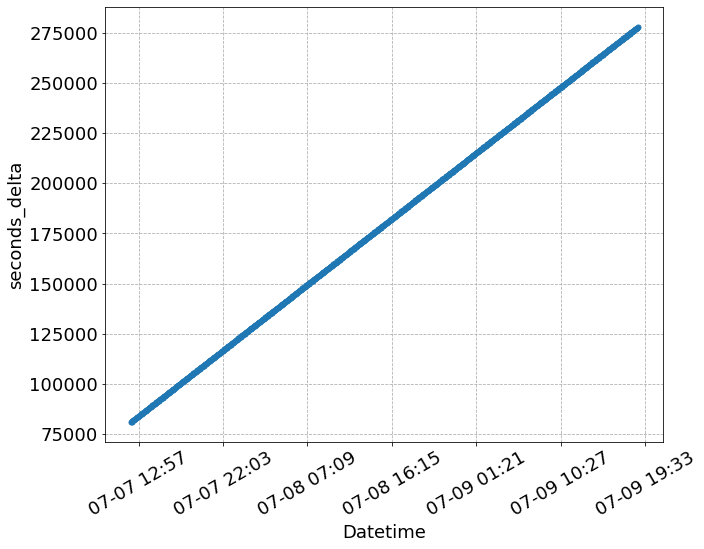

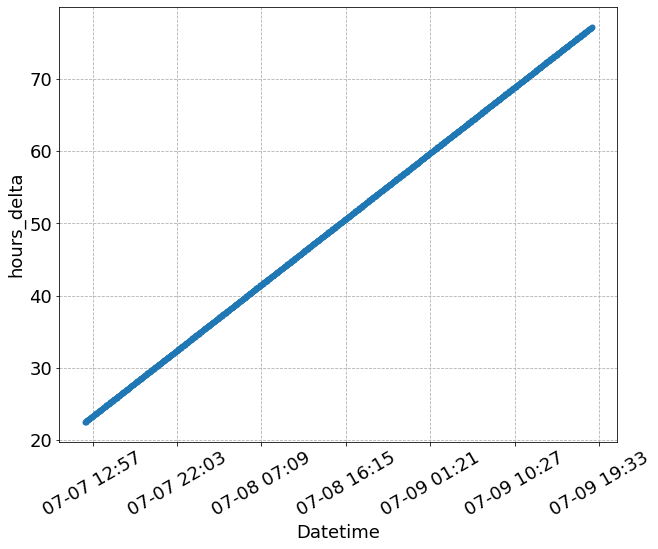

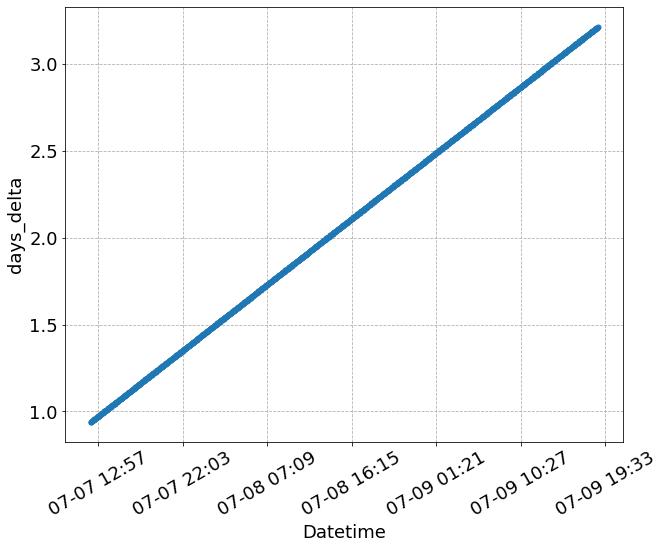

In [99]:
# plot vs. time
for col in df_t.columns:
    if is_numeric_dtype(df_t[col]):
        fig, ax = plt.subplots()
        ax = datetime_plt(ax, df_t.index, df_t[col], nmaj=6, Locator='Minute')
        ax.set_xlabel('Datetime')
        ax.set_ylabel(col)

In [100]:
# looking at angles in HP and SmarAct

In [105]:
# a1 = df['SmarAct_Meas_Angle_1'].values * np.pi / 180.
# a2 = df['SmarAct_Meas_Angle_2'].values * np.pi / 180.
# center around 0
a1 = df['SmarAct_Meas_Angle_1'].values * np.pi / 180.
a2 = df['SmarAct_Meas_Angle_2'].values * np.pi / 180.
a1[a1>np.pi] = a1[a1>np.pi]-2*np.pi
a2[a2>np.pi] = a2[a2>np.pi]-2*np.pi

In [106]:
np.max(a1), np.min(a1)

(0.10472020890526529, -0.17249654484137622)

In [107]:
np.degrees(np.max(a1)), np.degrees(np.min(a1))

(6.000026, -9.88332400000001)

In [41]:
r_th = df[f'{probe}_Raw_Theta'].values
r_ph = df[f'{probe}_Raw_Phi'].values
c_th = df[f'{probe}_Cal_Theta'].values
c_ph = df[f'{probe}_Cal_Phi'].values
c_th2 = df[f'{probe}_Cal_Theta2'].values
c_ph2 = df[f'{probe}_Cal_Phi2'].values

In [42]:
len(a1), len(r_th)

(23465, 23465)

In [43]:
# raw

In [44]:
df[f'{probe}_Raw_Theta'].describe()

count    23465.000000
mean         3.069647
std          0.038885
min          2.989054
25%          3.036556
50%          3.070666
75%          3.103719
max          3.141576
Name: 2F0000000D5EC73A_Raw_Theta, dtype: float64

In [45]:
df[f'{probe}_Raw_Theta'].max() - df[f'{probe}_Raw_Theta'].min()

0.15252177506954245

In [46]:
np.degrees(0.14787)

8.472326916599483

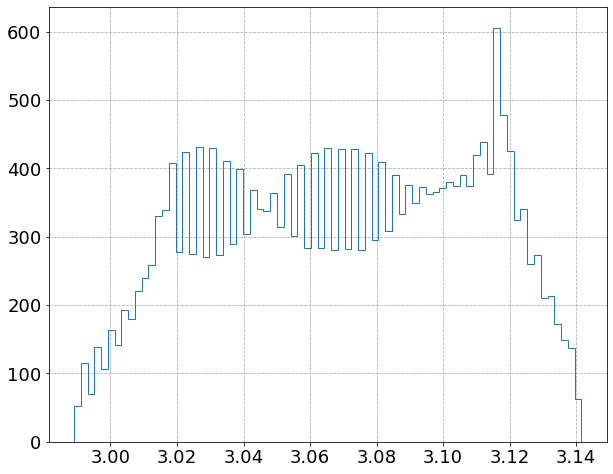

In [47]:
fig, ax = plt.subplots()
ax.hist(df[f'{probe}_Raw_Theta'], bins=75, histtype='step');

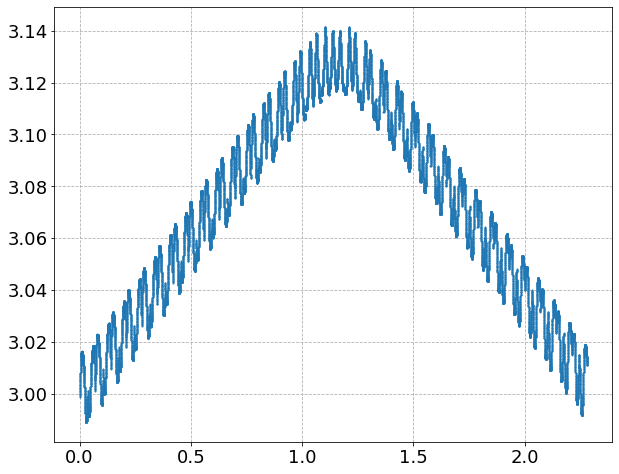

In [48]:
fig, ax = plt.subplots()
#ax.hist(df_[f'{probe}_Raw_Theta'], bins=75, histtype='step');
ax.scatter(df['days_delta'], df[f'{probe}_Raw_Theta'], s=1);

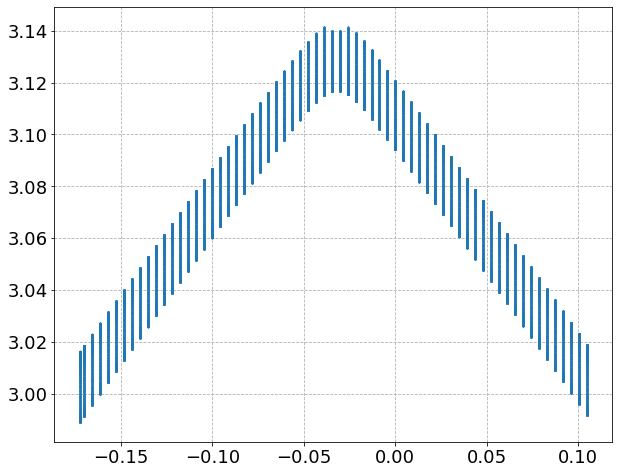

In [49]:
fig, ax = plt.subplots()
ax.scatter(a1, r_th, s=1);
# ax.scatter(a2, r_th, s=1);

Text(0, 0.5, '2F0000000D5EC73A_Raw_Phi')

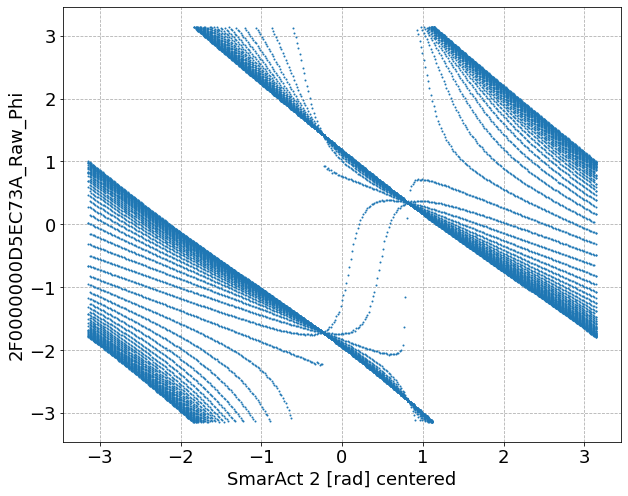

In [52]:
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
ax.scatter(a2, r_ph, s=1);

ax.set_xlabel('SmarAct 2 [rad] centered');
ax.set_ylabel(f'{probe}_Raw_Phi')

In [116]:
np.radians(2), np.radians(1.8)

(0.03490658503988659, 0.031415926535897934)

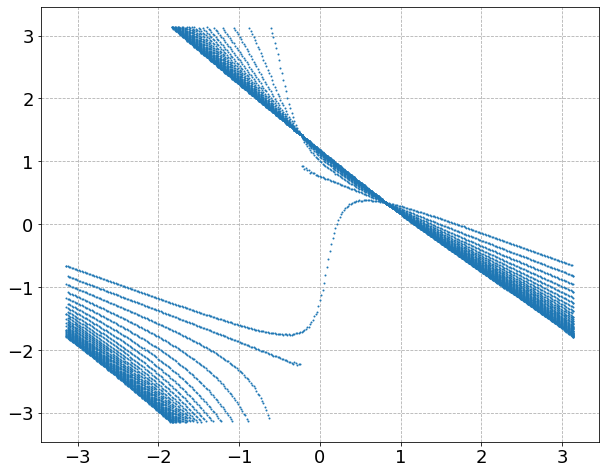

In [117]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
#ax.scatter(a2[a1 > -0.036], r_ph[a1 > -0.036], s=1);
ax.scatter(a2[a1 <= -0.0314], r_ph[a1 <= -0.0314], s=1);

In [118]:
a1

array([-0.17249628, -0.17249654, -0.17249611, ...,  0.10472016,
        0.1047201 ,  0.10471928])

In [125]:
len(a2)

23465

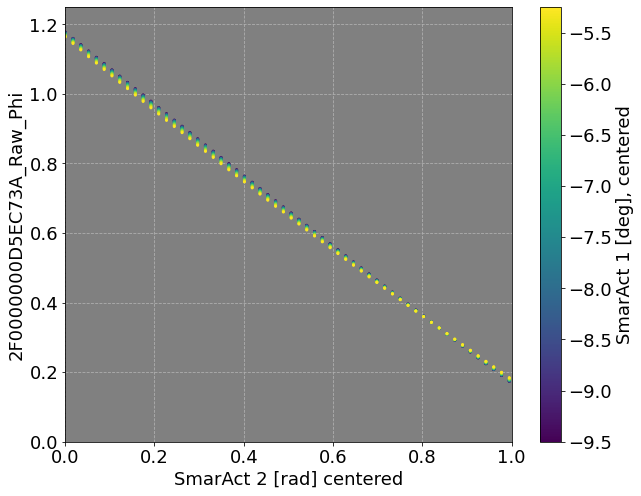

In [140]:
# limit a1 <= -5.25 deg
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
# ax.scatter(a2[a1 <= np.radians(-5.25)], r_ph[a1 <= np.radians(-5.25)], s=1);
# m = a1 <= np.radians(-5.25)
m = (a1 <= np.radians(-5.24)) & (a1 >= np.radians(-9.6))
sc = ax.scatter(a2[m], r_ph[m], c=df.SmarAct_Meas_Angle_1.values[m] - 360., s=4)
cb = fig.colorbar(sc, label='SmarAct 1 [deg], centered')

# zoom in
# ax.set_xlim([-np.pi-0.01, -2.0])
# ax.set_ylim([-np.pi-0.01, -1.7])
# ax.set_xlim([-np.pi-0.01, -3.0])
# ax.set_ylim([-2.0, -1.55])

# ax.set_xlim([-0.01, 0.01])
# ax.set_ylim([1.16, 1.18])

ax.set_xlim([0., 1.0])
ax.set_ylim([0., 1.25])

ax.set_facecolor('gray')

ax.set_xlabel(r'SmarAct 2 [rad] centered')
ax.set_ylabel(f'{probe}_Raw_Phi');

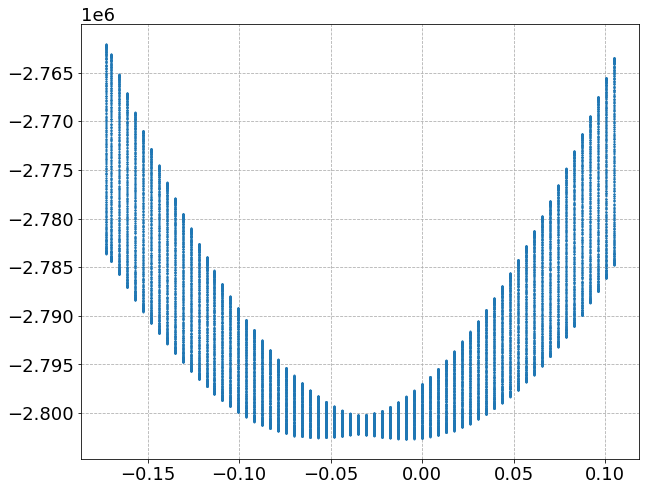

In [56]:
fig, ax = plt.subplots()
ax.scatter(a1, df[f'{probe}_Raw_Z'], s=1);
# ax.scatter(a2, r_th, s=1);

In [ ]:
# cal

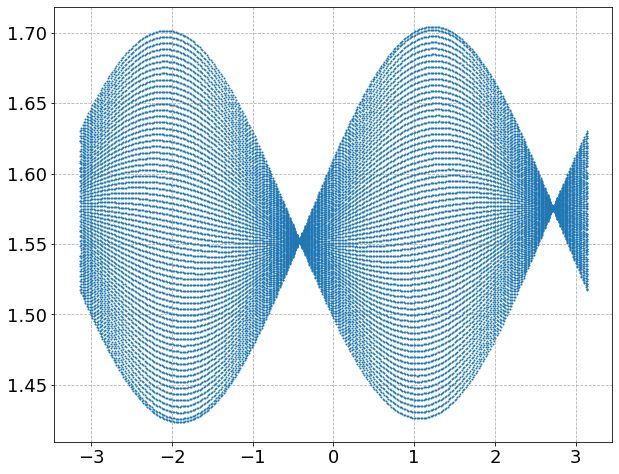

In [110]:
fig, ax = plt.subplots()
# ax.scatter(a1, c_th, s=1);
ax.scatter(a2, c_th, s=1);

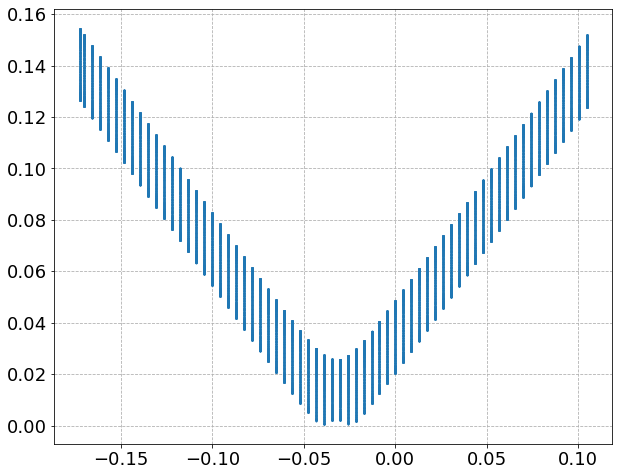

In [111]:
fig, ax = plt.subplots()
# ax.scatter(a1, c_th, s=1);
ax.scatter(a1, c_th2, s=1);

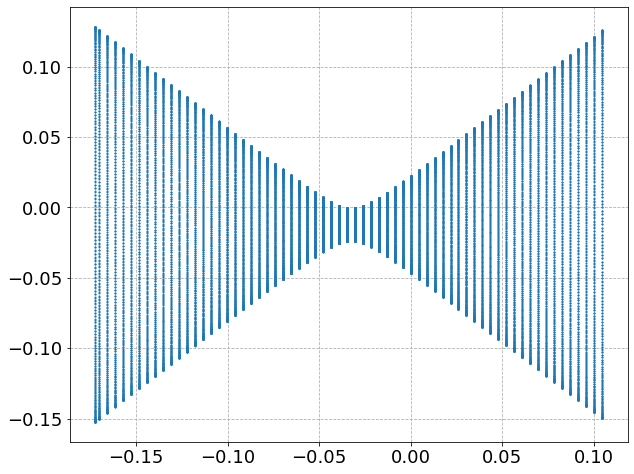

In [112]:
fig, ax = plt.subplots()
# ax.scatter(a2, c_ph, s=1);
ax.scatter(a1, c_ph, s=1);

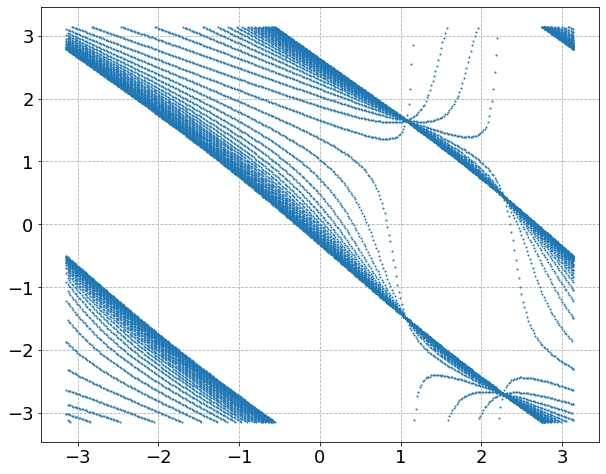

In [113]:
fig, ax = plt.subplots()
# ax.scatter(a2, c_ph, s=1);
ax.scatter(a2, c_ph2, s=1);

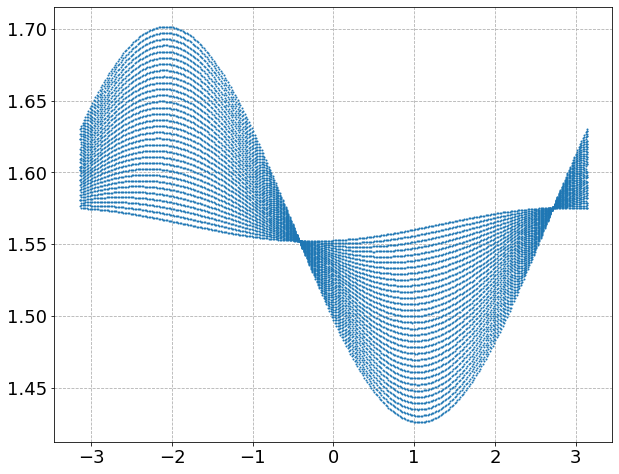

In [114]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_th[a1 > -0.034], s=1);

In [ ]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_th2[a1 > -0.034], s=1);

In [ ]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_ph[a1 > -0.034], s=1);

In [ ]:
# limit a1 < or > -0.035
fig, ax = plt.subplots()
ax.scatter(a2[a1 > -0.034], c_ph2[a1 > -0.034], s=1);

# Hall B Angles vs. Both SmarAct Motors
- 3D plot (i.e. scatter or surface if possible) may reveal how much of each motor in particular angle

## 2D Scatter, with color

In [ ]:
a1[np.argmax(r_th)], a2[np.argmax(r_th)]

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=r_th, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (Raw Voltage) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=r_ph, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (Raw Voltage) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
len(np.unique(np.round(a1, 3)))

In [ ]:
np.unique(np.round(a1, 3))

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_th, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (B Calibrated) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_ph, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (B Calibrated) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_th2, s=6);
cb = fig.colorbar(sc, label=r'$\theta$ (B Calibrated, reoriented) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=c_ph2, s=6);
cb = fig.colorbar(sc, label=r'$\phi$ (B Calibrated, reoriented) [rad]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

# Spherical Harmonics

- Not very useful in original orientation.

In [ ]:
#fig = spherical_scatter3d([df['SmarAct_Meas_Angle_2']], [df['SmarAct_Meas_Angle_1']+2.0], [df[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=True, title=None, filename=None)

# Look at a single Hall element (Voltage)

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df[f'{probe}_Raw_Z'], s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# scaled
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df[f'{probe}_Raw_Z'] / df[f'{probe}_Raw_Z'].min(), s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
df[f'{probe}_Raw_Z'].abs().max(), df[f'{probe}_Raw_Z'].abs().min()

- Notice negative slope appears to give cosine (I am guessing)
    - axis 1 / axis 0 $\approx -3.5 / 0.277 = -12.635$

In [ ]:
np.max(a1), np.min(a1), np.max(a1) - np.min(a1)

In [ ]:
-3.5 / 0.277

# Function to Parameterize Orientations

## v1
- $\theta, \phi$ parameterize normal vector of a single Hall element
- $\alpha, \beta$ parameterize normal vector of $\vec{B}$
- Assume axis 0 and axis 1 are orthogonal.

### Voltage Function

In [ ]:
def Hall_Voltage_gen_v1(axis0, axis1, **params):
    Vmax = params['Vmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    ###rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1 + params['phase']]).T, degrees=False) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    frac_B = np.dot(norm_B_rot, norm_Hall)
    V_meas = Vmax * frac_B
    if params['verbose'] == 1.:
        return V_meas, norm_Hall, norm_B, norm_B_rot, frac_B
    else:
        return V_meas

In [ ]:
# B aligned perfectly with Kinematic plate
params = {
    'Vmax': 2802521.0, # ~2e6
    'verbose': 0,
    'theta': np.pi - np.radians(5.),
    #'phi': np.radians(45.),
#     'phi': np.radians(0.),
    'phi': np.radians(180.),
    'alpha': 0.,
    'beta': 0.,
    'phase': 0.
}

In [ ]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [ ]:
#A0.flatten()

#181 * 17

#len(df)

#Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

#%timeit Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

#Vs

In [ ]:
Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# B aligned perfectly with Kinematic plate
# does phi change anything, or is it only theta that matters?
phis = np.arange(0., 360., 45.)
# phis = [0., 45., 60., 90., 1]
for phi in phis:
    params = {
        'Vmax': 2802521.0, # ~2e6
        'verbose': 0,
        'theta': np.pi - np.radians(2.),
#         'theta': np.pi,
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.radians(phi),
        'alpha': np.radians(-2.),
        'beta': 0.,
        'phase': 0.,
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
    cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

In [ ]:
# B aligned perfectly with Kinematic plate
# theta dependence (phi = 0)
thetas = np.arange(0., 180., 10.)
# phis = [0., 45., 60., 90., 1]
for theta in thetas:
    params = {
        'Vmax': 2802521.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(theta),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': 0.,
        'alpha': 0.,
        'beta': 0.,
        'phase': 0.,
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
    cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

### Fitting

- See if fit for a single Hall element can constrain all four parameters.
- Since we can physically see the Hall elements, SmarAct in the magnet, approximate field direction, we can be smart about initial conditions and limits, if it turns out it there are many minima.
- If it is not possible, may need to combine Hall elements, or combine measurements from different Hall probes (this would be a reason to do a second Hall probe angular scan ASAP).

In [ ]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [ ]:
# generate data, with noise
V0 = 2802521.0
sigma = 2.8e3
params_true = {
        'Vmax': V0, # ~2e6
        'verbose': 0,
        'theta': np.random.uniform(low=0., high=np.pi),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.random.uniform(low=-np.pi, high=np.pi),
        'alpha': np.random.uniform(low=0., high=np.radians(12.)),
        'beta': np.random.uniform(low=-np.pi, high=np.pi),
        #'phase': np.random.uniform(low=-np.pi, high=np.pi),
        'phase': 0.,
}
Vs = np.array([Hall_Voltage_gen_v1(a0, a1, **params_true) for a0, a1 in zip(A0.flatten(), A1.flatten())])
Vs_meas = Vs + np.random.normal(loc=0, scale=sigma, size=len(Vs)) # ~0.1% noise

In [ ]:
params_true

In [ ]:
Vs, Vs_meas

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Vs_meas, s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V] -- SIMULATED, with noise')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# fit!
model = lm.Model(Hall_Voltage_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Vmax', value=V0, vary=False)
params.add('Vmax', value=V0, vary=True)
# params.add('Vmax', value=V0, vary=True, min=0.99*V0, max=1.01*V0)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
params.add('phase', value=0., min=-np.pi, max=np.pi, vary=False) # this breaks the fit
# run fit
result = model.fit(Vs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma*np.ones_like(Vs_meas)), scale_covar=False)

In [ ]:
V0

In [ ]:
result

In [ ]:
params_true

### Fit on real data!

In [ ]:
V0 = df[f'{probe}_Raw_Z'].abs().max()

In [ ]:
V0

In [ ]:
sigma_est = 3e-5
# sigma_est = 1e-3
coord = 'Z'
# coord = 'X'
# coord = 'Y'
V0 = df[f'{probe}_Raw_{coord}'].abs().max()
Vs_meas = df[f'{probe}_Raw_{coord}'].values
# fit!
model = lm.Model(Hall_Voltage_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Vmax', value=V0, vary=False)
# params.add('Vmax', value=V0-623.56, vary=False) # adjustment from mean of deviations when using V0 (non-varying) 
params.add('Vmax', value=V0, vary=True)
# params.add('Vmax', value=V0, vary=True, min=V0)
# params.add('Vmax', value=V0, vary=True, min=0.99*V0, max=1.01*V0)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0. - np.pi/4, max=np.pi + np.pi/4)
params.add('phi', value=0., min=-np.pi, max=np.pi, vary=True)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi - np.pi/4, max=np.pi + np.pi/4, vary=True)
params.add('phase', value=0., min=-np.pi, max=np.pi, vary=False) # this breaks the fit
# best fit alpha and beta
# params.add('alpha', value=0.03240273, vary=False)
# params.add('beta', value=-3.14159265, vary=False)
# phi for X (really Y)
if coord == 'X':
    params.add('phi', value=-np.pi/2, vary=True, min=-np.pi/2 + np.radians(-10), max=-np.pi/2 + np.radians(10))
# phi for Y (really X)
if coord == 'Y':
    params.add('phi', value=0., vary=True, min=np.radians(-10), max=np.radians(10))

# run fit
# working
# result = model.fit(Vs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
#                    params=params, weights=1/(sigma_est*V0*np.ones_like(Vs_meas)), scale_covar=False)
# testing flipping sign of axis1
result = model.fit(Vs_meas, axis0=A0.flatten(), axis1=-A1.flatten(),
                   params=params, weights=1/(sigma_est*V0*np.ones_like(Vs_meas)), scale_covar=False)

In [ ]:
# 20 deg C
result

In [ ]:
def normalize_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arctan2(np.sin(angle_rad), np.cos(angle_rad)))
    else:
        return np.arctan2(np.sin(angle), np.cos(angle))

def normalize_polar_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arccos(np.cos(angle_rad)))
    else:
        return np.arccos(np.cos(angle))

In [ ]:
result.params['theta'].value, normalize_angle(result.params['theta'].value), normalize_polar_angle(result.params['theta'].value)

In [ ]:
if not np.isclose(normalize_angle(result.params['theta'].value), normalize_polar_angle(result.params['theta'].value)):
    print('Phi flipped')
    print(f'Phi0: {result.params["phi"].value}, Phi0 + pi: {normalize_angle(result.params["phi"].value+np.pi)}')

In [ ]:
result.params['beta'].value, normalize_angle(result.params['beta'].value)

In [ ]:
# th = 3*np.pi
th = 3.1*np.pi
# th = 2*np.pi
# th = (1.5)*np.pi

In [ ]:
normalize_angle(th)

In [ ]:
np.arccos(np.cos(th))

In [ ]:
# GOOD
np.arctan2(np.sin(th), np.cos(th))

In [ ]:
th // (2*np.pi)

In [ ]:
th - (2 * th // (2*np.pi) + 1) * np.pi

In [ ]:
4*np.pi

In [ ]:
# 15 deg C
result

In [ ]:
# fine data
result

In [ ]:
# V_1 (X), but I would call it Y
result

In [ ]:
np.degrees(1.5012)

In [ ]:
np.degrees(1.5010)

In [ ]:
# V_1 (Y)
result

In [ ]:
np.degrees(1.6274)

In [ ]:
np.degrees(1.6276)

In [ ]:
# V_3 (Z)
result

In [ ]:
np.degrees(result.params['theta'])

In [ ]:
np.degrees(result.params['phi'])

In [ ]:
np.degrees(result.params['alpha'])

In [ ]:
np.degrees(result.params['beta'])

- All values look about like what I expected! Great!
- As a consistency check, should run a fit like this for all probes going through calibration. If alpha, beta are consistent, it may be helpful to fix these to the "known" values.
- Can also check consistency with V_1 and V_2
- Ultimately, there is one final step, which is to take these parameters and

In [ ]:
result.best_fit

In [ ]:
# plots!
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [ ]:
Vmin = np.min([np.min(df[f'{probe}_Raw_{coord}']), np.min(result.best_fit)])
Vmax = np.max([np.max(df[f'{probe}_Raw_{coord}']), np.max(result.best_fit)])

In [ ]:
Vmin, Vmax

In [ ]:
# data, fit
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 8), gridspec_kw={'width_ratios': [1., 1.2]})
cmap = cm.get_cmap('viridis')
normalizer = Normalize(Vmin, Vmax)
im = cm.ScalarMappable(norm=normalizer)
sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Vs_meas, s=4, cmap=cmap, norm=normalizer)
sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

#cb = fig.colorbar(im, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')
cb = fig.colorbar(im, label=r'$V_3$ ("Z" Voltage) [$\mu$V]', ax=axs[1])

axs[0].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[0].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[0].set_title('Measured Values')
axs[1].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[1].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[1].set_title('Best Fit Values: \n'+
                 rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
                 rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

In [ ]:
### ADD TO DATA PROCESSING!!! FIXME!
# interpolate NMR
# set time from temp file
df['seconds_delta'] = (df.index - df_temp.index[0]).total_seconds()
df['hours_delta'] = (df.index - df_temp.index[0]).total_seconds()/60**2
df['days_delta'] = (df.index - df_temp.index[0]).total_seconds()/(24*60**2)
nmr_interp = interp1d(df_temp.seconds_delta, df_temp["NMR [T]"])
nmr_vals = nmr_interp(df['seconds_delta'])
df.loc[:, 'NMR [T]'] = nmr_vals

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df['NMR [T]'], df[f'{probe}_Cal_Bmag'], s=1)

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df.index, df[f'{probe}_Cal_Bmag']-df['NMR [T]'], s=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist((df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]'], histtype='step', bins=100);

In [ ]:
res_rel = (df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]']
res_rel.mean(), res_rel.std()

In [ ]:
# check NMR and temp stability
for col in ['NMR [T]', f'{probe}_Cal_T']:
    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=df[col], s=4);
    cb = fig.colorbar(sc, label=col)

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
result.params['theta'].value

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Vs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit');

In [ ]:
# data / fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Vs_meas / result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$V_{3, meas.} / V_{3, fit}$ ("Z" Voltage)')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data / Fit');

In [ ]:
Vs_meas - result.best_fit

In [ ]:
Vs_meas / result.best_fit

In [ ]:
Vs_meas, result.best_fit

In [ ]:
# histograms

In [ ]:
len(Vs_meas)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Vs_meas - result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data - Fit [$\mu$V]')

In [ ]:
np.mean(Vs_meas - result.best_fit), np.std(Vs_meas - result.best_fit, ddof=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Vs_meas / result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data / Fit')

In [ ]:
np.mean(Vs_meas / result.best_fit), np.std(Vs_meas / result.best_fit, ddof=1)

# Convert from fitted params to $\theta, \phi$

In [ ]:
def B_Angles_Kinematic_from_SmarAct_v1(axis0, axis1, degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    #norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate theta, phi
    B_T = np.linalg.norm(norm_B_rot[:2])
    theta = np.arctan2(B_T, norm_B_rot[2])
    phi = np.arctan2(norm_B_rot[1], norm_B_rot[0]) + params['phase']
    return theta, phi

# phi has not been fixed!
def B_Theta_Hall_3_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    theta = np.arccos(np.dot(norm_B_rot, norm_Hall))
    
    return theta

# pick an arbitrary phi
def B_Angles_Hall_3_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    #rotHall = Rotation.from_euler('yz', angles=np.array([params['theta'].value, params['phi'].value]).T, degrees=False) # theta wrong
#     rotHall = Rotation.from_euler('yz', angles=np.array([-params['theta'].value, -params['phi'].value]).T, degrees=False) # theta ok, phi seems weird
    rotHall = Rotation.from_euler('ZY', angles=np.array([-params['phi'], -params['theta']]).T, degrees=False) # theta ok, phi seems weird
    norm_B_rot = rotHall.apply(rot.apply(norm_B))
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    #theta = np.arccos(np.dot(norm_B_rot, norm_Hall))
    B_T = np.linalg.norm(norm_B_rot[:2])
    theta = np.arctan2(B_T, norm_B_rot[2])
    phi = np.arctan2(norm_B_rot[1], norm_B_rot[0]) + params['phase']
    
    return theta, phi

# doesn't work as intended
'''
# get alpha, beta from theta, phi (or SmarAct) -- Planar Hall Effect. Phi might need a phase here.
def B_alpha_beta_Hall_3_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    theta, phi = B_Angles_Hall_3_from_SmarAct_v1(axis0, axis1, degrees=degrees, **params)
    B = 1.
    Bx = np.sin(theta) * np.cos(phi + params['phase_phi'])
    By = np.sin(theta) * np.sin(phi + params['phase_phi'])
    alpha = np.arccos(Bx / B)
    beta = np.arccos(By / B)
    
    return alpha, beta
'''

# get alpha, beta from theta, phi -- Planar Hall Effect. Phi might need a phase here.
def B_alpha_beta_Hall_3_from_theta_phi_v1(theta, phi,  degrees=False, **params):
    if degrees:
        theta = np.radians(theta)
        phi = np.radians(phi)
    B = 1.
    Bx = np.sin(theta) * np.cos(phi + params['phase_phi'])
    By = np.sin(theta) * np.sin(phi + params['phase_phi'])
    alpha = np.arccos(Bx / B)
    beta = np.arccos(By / B)
    
    return alpha, beta

In [ ]:
# theta and phi, kinematic plate
'''th_list = []
ph_list = []
for row in df.itertuples():
    th, ph = B_Angles_Kinematic_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'phi_B'] = ph_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df.loc[:, 'phi_B_deg'] = np.degrees(ph_list)'''
pass;

In [ ]:
# theta only, Hall element V3
th_list = []
for row in df.itertuples():
    th = B_Theta_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
th_list = np.array(th_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)

In [ ]:
result.params['phase'].value

In [ ]:
result.params['phase'].value = 2.3
result.params['phase'].value

In [ ]:
# theta and phi, Hall element V3, arbitrary phi!
th_list = []
ph_list = []
for row in df.itertuples():
    th, ph = B_Angles_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'phi_B'] = ph_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df.loc[:, 'phi_B_deg'] = np.degrees(ph_list)

In [ ]:
# raw

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'{probe}_Raw_Theta'], s=1);
x1 = df['theta_B'].min()
x2 = df['theta_B'].max()
ax.plot([x1, x2], [x1, x2], 'r--')

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], r_th, s=1);
ax.plot([df['theta_B'].min(), df['theta_B'].max()], [df['theta_B'].min(), df['theta_B'].max()], 'r--');

In [ ]:
# fig, ax = plt.subplots()
# ax.scatter(df['phi_B'], r_ph, s=1);

In [ ]:
# limit a1 < or > -0.035
cut = -0.036
#phase = np.pi - 1.1
phase = 0.
fig, ax = plt.subplots()
#ax.scatter(a2, r_ph, s=1);
x = df['phi_B'].values[a1 > cut]+phase
x[x>np.pi] = x[x>np.pi] - 2*np.pi
ax.scatter(x, -r_ph[a1 > cut], s=1);
ax.plot([-np.pi, np.pi], [-np.pi, np.pi], 'r--')

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'{probe}_Raw_Z'], s=1);
# ax.scatter(a2, r_th, s=1);

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z'], s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_title('Measured Values')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad]');

In [ ]:
fig, ax = plt.subplots()
# sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z'], s=4);
# cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

sc = ax.scatter(df['theta_B'], df['phi_B'], c=Vs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad]');

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df['theta_B'], Vs_meas - result.best_fit, s=3);

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df['phi_B'], Vs_meas - result.best_fit, s=3);

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\phi$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
# guess parameters for PHE
A = 50000.
p0 = np.pi/2+0.01
p1 = 2.3
off = -200.
y = A*np.cos(df['phi_B'] + p1)*np.cos(df['theta_B'] + p0) + off

fig, ax = plt.subplots()
ax.scatter(df['phi_B'], Vs_meas - result.best_fit, s=3, c='gray');
ax.scatter(df['phi_B'], y, s=3, c='blue', alpha=0.6);

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\phi$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
# fit PHE model to residuals
def mod_PHE(theta, phi, **params):
    return params['A'] * np.cos(phi + params['p1']) * np.cos(theta + params['p0']) + params['off']

In [ ]:
model_PHE = lm.Model(mod_PHE, independent_vars=['theta', 'phi'])
params_PHE = lm.Parameters()
params_PHE.add('A', value=100, min=0, vary=True)
#params_PHE.add('p0', value=0, min=-np.pi, max=np.pi, vary=True)
params_PHE.add('p0', value=np.pi/2, min=0., max=np.pi, vary=True)
params_PHE.add('p1', value=0, min=-np.pi, max=np.pi, vary=True)
params_PHE.add('off', value=0, vary=True)

In [ ]:
result_PHE = model_PHE.fit(Vs_meas - result.best_fit, theta=df['theta_B'].values, phi=df['phi_B'].values,
                           params=params_PHE, scale_covar=False)

In [ ]:
result_PHE

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['phi_B'], Vs_meas - result.best_fit, s=3, c='gray');
ax.scatter(df['phi_B'], result_PHE.best_fit, s=3, c='blue', alpha=0.6);

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\phi$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['phi_B'], Vs_meas - result.best_fit - result_PHE.best_fit, s=3, c='blue');
# ax.scatter(df['phi_B'], , s=3, c='blue', alpha=0.6);

ax.set_title('Measured Values - Fit - Fit_PHE')

ax.set_xlabel(r'$\phi$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], Vs_meas - result.best_fit - result_PHE.best_fit, s=3, c='blue');
# ax.scatter(df['phi_B'], , s=3, c='blue', alpha=0.6);

ax.set_title('Measured Values - Fit - Fit_PHE')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]');

In [ ]:
fig, ax = plt.subplots()
# sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z'], s=4);
# cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

x = df['phi_B'].values
x[x>np.pi] = x[x>np.pi] - 2*np.pi

sc = ax.scatter(df['theta_B'], x, c=Vs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_xlabel(r'$\theta$ [rad]')

In [ ]:
# recalculate fit with phase
fig, ax = plt.subplots()
# sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z'], s=4);
# cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

x = df['phi_B'].values
x[x>np.pi] = x[x>np.pi] - 2*np.pi

# c = B_Angles_Hall_3_from_SmarAct_v1(A0.flatten(), -A1.flatten(), **result.params)
c = Hall_Voltage_gen_v1(A0.flatten(), A1.flatten(), **result.params)

# sc = ax.scatter(df['theta_B'], x, c=Vs_meas - result.best_fit, s=4);
sc = ax.scatter(df['theta_B'], x, c=Vs_meas - c, s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_title('Measured Values - Fit')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad]');

In [ ]:
df.iloc[np.argmin(df['SmarAct_Meas_Angle_1'])]

# Which Data To Use

In [ ]:
result

In [ ]:
normalize_polar_angle(result.params['theta'], degrees=False)

In [ ]:
180 - np.degrees(normalize_polar_angle(result.params['theta'], degrees=False))

In [ ]:
np.degrees(result.params['alpha'])

In [ ]:
df.loc[:, 'a1'] = np.arctan2(np.sin(np.radians(df.SmarAct_Meas_Angle_1)), np.cos(np.radians(df.SmarAct_Meas_Angle_1)))
df.loc[:, 'a1_deg'] = np.degrees(df.loc[:, 'a1'])

In [ ]:
df.a1.describe()

In [ ]:
df.a1_deg.describe()

In [ ]:
# all
# df_ = df.copy()
# theta > 0
df_ = df.query('a1_deg > -2.').copy() # conservatively covers 0.

In [ ]:
len(df_), len(df)

In [ ]:
df_.theta_B_deg.describe()

In [ ]:
df.SmarAct_Meas_Angle_1

# Fit $\cos(\theta)$ term

In [ ]:
# theta only, Hall element V3
th_list = []
for row in df_.itertuples():
    th = B_Theta_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
th_list = np.array(th_list)
df_.loc[:, 'theta_B'] = th_list
df_.loc[:, 'theta_B_deg'] = np.degrees(th_list)

In [ ]:
# theta and phi, Hall element V3, arbitrary phi!
th_list = []
ph_list = []
for row in df_.itertuples():
    th, ph = B_Angles_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
df_.loc[:, 'theta_B'] = th_list
df_.loc[:, 'phi_B'] = ph_list
df_.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df_.loc[:, 'phi_B_deg'] = np.degrees(ph_list)

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z'], s=1);
ax.plot(df_['theta_B'], df_[f'{probe}_Raw_Z'].abs().max()*np.cos(df_['theta_B']), 'r--');

In [ ]:
# def costheta_fit(theta, **params):
#     return params['Vmax'] * np.cos(theta)

def costheta_fit(theta, **params):
    return params['Vmax'] * np.cos(theta) + params['Voff']

In [ ]:
model = lm.Model(costheta_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax', value=df_[f'{probe}_Raw_Z'].abs().max(), vary=True)
params.add('Voff', value=0., vary=False)
result_costheta = model.fit(df_[f'{probe}_Raw_Z'].values, theta=df_['theta_B'].values, params=params)

In [ ]:
result_costheta

In [ ]:
result_costheta.plot()

In [ ]:
#fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z'].abs()], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
thetas = np.linspace(180-10, 180, 201)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_costheta.params['Vmax'].value
V = V0 * np.cos(np.radians(TH))
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos'] = df_.loc[:, f'{probe}_Raw_Z'] - result_costheta.best_fit

In [ ]:
# good one
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
np.degrees(np.pi-3.025)

In [ ]:
# phis = np.linspace(-np.pi, np.pi, 101)
# thetas = np.linspace(2.98, np.pi, 101)
# PH, TH = np.meshgrid(phis, thetas)
PH = df_['phi_B'].values
TH = df_['theta_B'].values
N = 8*df_[f'{probe}_Raw_Z_min_cos'].abs().max()
#M = df[f'{probe}_Raw_Z_min_cos'].abs().max()
phase = np.pi
phase_th = 0. #0.3*np.pi
ys = N * np.sin(PH + phase) * np.sin(TH + phase_th)

In [ ]:
# Y_3_0
# phis = np.linspace(-np.pi, np.pi, 101)
# thetas = np.linspace(2.98, np.pi, 101)
# PH, TH = np.meshgrid(phis, thetas)
#PH = df['phi_B'].values
TH = df_['theta_B'].values
N = 0.02*df_[f'{probe}_Raw_Z_min_cos'].abs().max()
#M = df[f'{probe}_Raw_Z_min_cos'].abs().max()
#phase = np.pi
#phase_th = 0. #0.3*np.pi
ys = N * (5*np.cos(TH)**3 - 3*np.cos(TH))

- **STOPPED HERE!**
- Should actually get $\alpha, \beta$ from field vector. Make another function, like that for getting $\theta, \phi$

In [ ]:
# trying to add PHE as in Figure 4.1 of Popovic book (page 185)
V = df_[f'{probe}_Raw_Z_min_cos'].values
Vx = V * np.sin(df_['theta_B']) * np.cos(df_['phi_B'])
Vy = V * np.sin(df_['theta_B']) * np.sin(df_['phi_B'])
# Vz = df_[f'{probe}_Raw_Z_min_cos'] * np.cos(df_['theta_B'])
alpha = np.arccos(Vx/V)
beta = np.arccos(Vy/V)
#####
N = 1*df_[f'{probe}_Raw_Z_min_cos'].abs().max()
phase_a = np.pi / 8
phase_b = 0. #0.3*np.pi
#ys = N * np.cos(alpha + phase_a) * np.cos(beta + phase_b)
ys = N * np.sin(2*alpha + phase_a)
PH = df_['phi_B'].values
TH = df_['theta_B'].values

In [ ]:
alpha, beta

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['phi_B'], df_[f'{probe}_Raw_Z_min_cos'], s=4);
# ax.plot(phis, ys, 'r--')
#ax.plot(PH.flatten(), ys.flatten(), 'r--')
ax.plot(PH, ys, 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z_min_cos'], s=4);
# ax.plot(TH.flatten(), ys.flatten(), 'r--')
ax.plot(TH, ys, 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
df_['theta_B'].max()

- $\sin(\theta) \cos(\phi)$

# Fit PHE to residuals
- Expect $Y_{3,0}$ to be competitive in size...may need to fit that at the same time.

In [ ]:
#df_['2F0000000D5EC73A_Raw_Z_min_cos']

In [ ]:
def PHE_fit(theta, phi, **params):
    alpha, beta = B_alpha_beta_Hall_3_from_theta_phi_v1(theta, phi, degrees=False, **params) # note params["phase_phi"] buried in this function
    return params['Vmax_PHE'] * np.cos(alpha) * np.cos(beta) # + params['Voff']

In [ ]:
#PHE_fit(df_['theta_B'].values, df_['phi_B'].values, **params)

In [ ]:
model = lm.Model(PHE_fit, independent_vars=['theta', 'phi'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
params.add('Vmax_PHE', value=df_[f'{probe}_Raw_Z_min_cos'].abs().max(), vary=True)
params.add('phase_phi', value=0., vary=True, min=-np.pi, max=np.pi)
result_PHE = model.fit(df_[f'{probe}_Raw_Z_min_cos'].values, theta=df_['theta_B'].values, phi=df_['phi_B'].values, params=params)

In [ ]:
result_PHE

In [ ]:
#result_costheta

In [ ]:
result_PHE.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos'] - result_PHE.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos'] - result_PHE.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos']
V2 = df_[f'{probe}_Raw_Z_min_cos'] - result_PHE.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
result_PHE.best_fit

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
thetas = np.linspace(180-10, 180, 201)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_PHE.params['Vmax_PHE'].value
#phase = result_PHE.params['phase_phi'].value
ALPHA, BETA = B_alpha_beta_Hall_3_from_theta_phi_v1(TH, PH, degrees=True, **result_PHE.params)
V = V0 * np.cos(ALPHA) * np.cos(BETA)
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
#fig = spherical_scatter3d([df_['phi_B_deg'], df_temp['phi']], [df_['theta_B_deg'], df_temp['theta']], [df_[f'{probe}_Raw_Z'], df_temp['V']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
#fig = spherical_scatter3d([df_['phi_B_deg'], df_temp['phi']], [df_['theta_B_deg'], df_temp['theta']], [df_[f'{probe}_Raw_Z'], df_temp['V']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
# good one
# fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_PHE_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_PHE'] = df_.loc[:, f'{probe}_Raw_Z_min_cos'] - result_costheta.best_fit

In [ ]:
# good one
#fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

# Fit $Y_{1,1}$ to residuals (cos term only)
- PHE did not appear to be the next largest contribution. Bergsma says "$Y_{1,1}$ is 0 by rotation". Let's see if we can fit it.

In [ ]:
#df_['2F0000000D5EC73A_Raw_Z_min_cos']

In [ ]:
# fitting real part of Y_11
def Y11_fit(theta, phi, **params):
    return params['Vmax_Y11'] * np.cos(phi + params['phase_phi']) * np.sin(theta) # + params['Voff']

In [ ]:
model = lm.Model(Y11_fit, independent_vars=['theta', 'phi'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
params.add('Vmax_Y11', value=df_[f'{probe}_Raw_Z_min_cos'].abs().max(), vary=True)
params.add('phase_phi', value=0., vary=True, min=-np.pi, max=np.pi)
result_Y11 = model.fit(df_[f'{probe}_Raw_Z_min_cos'].values, theta=df_['theta_B'].values, phi=df_['phi_B'].values, params=params)

In [ ]:
result_Y11

In [ ]:
np.pi/2

In [ ]:
#result_costheta

In [ ]:
result_Y11.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos']
V2 = df_[f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
result_PHE.best_fit

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
thetas = np.linspace(180-10, 180, 201)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_Y11.params['Vmax_Y11'].value
phase = result_Y11.params['phase_phi'].value
V = V0 * np.cos(np.radians(PH) + phase) * np.sin(np.radians(TH))
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
# fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_Y11_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] = df_.loc[:, f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit

In [ ]:
# good one
#fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos_min_Y11.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$, $Y_{1,1}$ terms subtracted');

In [ ]:
df_['2F0000000D5EC73A_Raw_Bmag'].describe()

In [ ]:
1500 / df_['2F0000000D5EC73A_Raw_Bmag'].max()

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['phi_B'], df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
# ax.plot(phis, ys, 'r--')
#ax.plot(PH.flatten(), ys.flatten(), 'r--')
# ax.plot(PH, ys, 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
# ax.plot(TH.flatten(), ys.flatten(), 'r--')
# ax.plot(TH, ys, 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

# Fit PHE to residuals of $Y_{1,0}$ ($\cos(\theta)$), $Y_{1,1}$
- Expect $Y_{3,0}$ to be competitive in size...may need to fit that at the same time.

In [ ]:
def PHE_fit(theta, phi, **params):
    alpha, beta = B_alpha_beta_Hall_3_from_theta_phi_v1(theta, phi, degrees=False, **params) # note params["phase_phi"] buried in this function
    return params['Vmax_PHE'] * np.cos(alpha) * np.cos(beta) # + params['Voff']

In [ ]:
#PHE_fit(df_['theta_B'].values, df_['phi_B'].values, **params)

In [ ]:
model = lm.Model(PHE_fit, independent_vars=['theta', 'phi'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
params.add('Vmax_PHE', value=df_[f'{probe}_Raw_Z_min_cos_Y11'].abs().max(), vary=True)
params.add('phase_phi', value=0., vary=True, min=-np.pi, max=np.pi)
result_PHE = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, theta=df_['theta_B'].values, phi=df_['phi_B'].values, params=params)

In [ ]:
result_PHE

In [ ]:
result_Y11

In [ ]:
#result_costheta

In [ ]:
result_PHE.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_PHE.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_PHE.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos_Y11']
V2 = df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_PHE.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
result_PHE.best_fit

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
thetas = np.linspace(180-10, 180, 201)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_PHE.params['Vmax_PHE'].value
#phase = result_PHE.params['phase_phi'].value
ALPHA, BETA = B_alpha_beta_Hall_3_from_theta_phi_v1(TH, PH, degrees=True, **result_PHE.params)
V = V0 * np.cos(ALPHA) * np.cos(BETA)
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_PHE_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_PHE'] = df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] - result_PHE.best_fit

In [ ]:
# good one
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos_Y11_PHE']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos_Y11_PHE.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos_Y11_PHE'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

# Fit $Y_{3,0}$ to residuals of $Y_{1,0}$ ($\cos(\theta)$), $Y_{1,1}$

- Possibly include offset term $Y_{0,0}$
- Residuals appear to be ~50% $Y_{3,0}$, and ~50% some term with ~$\sin(\theta)$ dependence
- Note that $Y_{2,0}$ and $Y_{3,0}$ look similar, except for symmetry about XY plane. If it is hard to distinguish based on shape, may be able to distinguish by including data with current polarity flipped.

In [ ]:
# fitting Y_30
def Y30_fit(theta, **params):
    return params['Vmax_Y30'] * (5 * np.cos(theta)**3 - 3 * np.cos(theta)) + params['V_off']

In [ ]:
model = lm.Model(Y30_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax_Y30', value=-df_[f'{probe}_Raw_Z_min_cos_Y11'].abs().max(), vary=True)
params.add('V_off', value=0., vary=False)
result_Y30 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, theta=df_['theta_B'].values, params=params)

In [ ]:
result_Y30

In [ ]:
result_Y11

In [ ]:
np.pi/2

In [ ]:
#result_costheta

In [ ]:
result_Y11.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y30.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y30.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos_Y11']
V2 = df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y30.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
##thetas = np.linspace(180-10, 180, 201)
thetas = np.linspace(0, 180, 361)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_Y30.params['Vmax_Y30'].value
V_off = result_Y30.params['V_off'].value
V = V0 * (5*np.cos(np.radians(TH))**3 - 3*np.cos(np.radians(TH))) + V_off
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
# fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_Y30_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_Y30'] = df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] - result_Y30.best_fit

In [ ]:
# good one
#fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos_Y11_Y30']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos_min_Y11_min_Y30.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos_Y11_Y30'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$, $Y_{1,1}$ terms subtracted');

In [ ]:
df_['2F0000000D5EC73A_Raw_Bmag'].describe()

In [ ]:
1500 / df_['2F0000000D5EC73A_Raw_Bmag'].max()

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['phi_B'], df_[f'{probe}_Raw_Z_min_cos_Y11_Y30'], s=4);
# ax.plot(phis, ys, 'r--')
#ax.plot(PH.flatten(), ys.flatten(), 'r--')
# ax.plot(PH, ys, 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z_min_cos_Y11_Y30'], s=4);
# ax.plot(TH.flatten(), ys.flatten(), 'r--')
# ax.plot(TH, ys, 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

# Fit $Y_{2,0}$ to residuals of $Y_{1,0}$ ($\cos(\theta)$), $Y_{1,1}$

- Possibly include offset term $Y_{0,0}$ ?

In [ ]:
# fitting Y_20
def Y20_fit(theta, **params):
    return params['Vmax_Y20'] * (3 * np.cos(theta)**2 - 1) + params['V_off']

In [ ]:
model = lm.Model(Y20_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax_Y20', value=df_[f'{probe}_Raw_Z_min_cos_Y11'].abs().max(), vary=True)
params.add('V_off', value=0., vary=False)
result_Y20 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, theta=df_['theta_B'].values, params=params)

In [ ]:
result_Y20

In [ ]:
result_Y11

In [ ]:
np.pi/2

In [ ]:
#result_costheta

In [ ]:
result_Y11.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
1e3 / 2.8e6

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y20.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y20.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos_Y11']
V2 = df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y20.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
##thetas = np.linspace(180-10, 180, 201)
thetas = np.linspace(0, 180, 361)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_Y20.params['Vmax_Y20'].value
V_off = result_Y20.params['V_off'].value
V = V0 * (3*np.cos(np.radians(TH))**2 - 1) + V_off
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
# fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_Y20_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_Y20'] = df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] - result_Y20.best_fit

In [ ]:
# good one
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos_Y11_Y20']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos_min_Y11_min_Y20.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos_Y11_Y20'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$, $Y_{1,1}$ terms subtracted');

In [ ]:
df_['2F0000000D5EC73A_Raw_Bmag'].describe()

In [ ]:
1500 / df_['2F0000000D5EC73A_Raw_Bmag'].max()

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['phi_B'], df_[f'{probe}_Raw_Z_min_cos_Y11_Y20'], s=4);
# ax.plot(phis, ys, 'r--')
#ax.plot(PH.flatten(), ys.flatten(), 'r--')
# ax.plot(PH, ys, 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z_min_cos_Y11_Y20'], s=4);
# ax.plot(TH.flatten(), ys.flatten(), 'r--')
# ax.plot(TH, ys, 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
df_[f'{probe}_Raw_Z_min_cos_Y11_Y20'].describe()

# Fit $Y_{0,0}$ to residuals of $Y_{1,0}$ ($\cos(\theta)$), $Y_{1,1}$

In [ ]:
# fitting Y_00 (constant)
def Y00_fit(**params):
# def Y00_fit(theta, **params):
    return params['Vmax_Y00']

In [ ]:
model = lm.Model(Y00_fit, independent_vars=[])
# model = lm.Model(Y00_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax_Y00', value=0., vary=True)
result_Y00 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, params=params)
# result_Y00 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, theta=df_['theta_B'].values, params=params)

In [ ]:
result_Y00

In [ ]:
result_Y11

In [ ]:
np.pi/2

In [ ]:
#result_costheta

In [ ]:
result_Y11.plot()

In [ ]:
# histograms, before and after

In [ ]:
# before
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');

In [ ]:
# after
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y00.best_fit, bins=50, histtype='step')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$ - PHE');

In [ ]:
# before & after
fig, ax = plt.subplots()

n, bins, patches = ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=50, histtype='step', label='Data - cos(theta)')
ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y00.best_fit, bins=bins, histtype='step', label='Data - cos(theta) - PHE')

ax.set_xlabel(r'$(V_3 - \cos(\theta))$');
ax.legend();

In [ ]:
V1 = df_[f'{probe}_Raw_Z_min_cos_Y11']
V2 = df_[f'{probe}_Raw_Z_min_cos_Y11'] - result_Y30.best_fit

In [ ]:
np.mean(V1), np.std(V1)

In [ ]:
np.mean(V2), np.std(V2)

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
##thetas = np.linspace(180-10, 180, 201)
thetas = np.linspace(0, 180, 361)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_Y30.params['Vmax_Y30'].value
V_off = result_Y30.params['V_off'].value
V = V0 * (5*np.cos(np.radians(TH))**3 - 3*np.cos(np.radians(TH))) + V_off
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
# good one
# fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['purp', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_Y30_fit.html', auto_open=False)

In [ ]:
df_['theta_B_deg'].max(), df_['theta_B_deg'].min()

In [ ]:
df_.iloc[np.argmin(df_['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] = df_.loc[:, f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit

In [ ]:
# good one
#fig = spherical_scatter3d([df_temp['phi'], df_['phi_B_deg']], [df_temp['theta'], df_['theta_B_deg']], [df_temp['V'], df_[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df_['phi_B_deg']], [df_['theta_B_deg']], [df_[f'{probe}_Raw_Z_min_cos_Y11']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos_min_Y11.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df_['theta_B'], df_['phi_B'], c=df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$, $Y_{1,1}$ terms subtracted');

In [ ]:
df_['2F0000000D5EC73A_Raw_Bmag'].describe()

In [ ]:
1500 / df_['2F0000000D5EC73A_Raw_Bmag'].max()

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['phi_B'], df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
# ax.plot(phis, ys, 'r--')
#ax.plot(PH.flatten(), ys.flatten(), 'r--')
# ax.plot(PH, ys, 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df_['theta_B'], df_[f'{probe}_Raw_Z_min_cos_Y11'], s=4);
# ax.plot(TH.flatten(), ys.flatten(), 'r--')
# ax.plot(TH, ys, 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

# Fit $\cos(\theta)$, PHE, Offset terms

**THIS HAS NOT BEEN REWRITTEN, JUST COPIED.**

In [ ]:
# # theta only, Hall element V3
# th_list = []
# for row in df.itertuples():
#     th = B_Theta_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
#     th_list.append(th)
# th_list = np.array(th_list)
# df.loc[:, 'theta_B'] = th_list
# df.loc[:, 'theta_B_deg'] = np.degrees(th_list)

In [ ]:
# theta and phi, Hall element V3, arbitrary phi!
th_list = []
ph_list = []
for row in df.itertuples():
    th, ph = B_Angles_Hall_3_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'phi_B'] = ph_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df.loc[:, 'phi_B_deg'] = np.degrees(ph_list)

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'{probe}_Raw_Z'], s=1);
ax.plot(df['theta_B'], df[f'{probe}_Raw_Z'].abs().max()*np.cos(df['theta_B']), 'r--');

In [ ]:
# def costheta_fit(theta, **params):
#     return params['Vmax'] * np.cos(theta)

def angular_fit_v1(theta, phi, **params):
    # cos(theta), PHE, offset
    return params['Vmax'] * np.cos(theta) + params['Voff']

In [ ]:
model = lm.Model(costheta_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax', value=df[f'{probe}_Raw_Z'].abs().max(), vary=True)
params.add('Voff', value=0., vary=True)
result_costheta = model.fit(df[f'{probe}_Raw_Z'].values, theta=df['theta_B'].values, params=params)

In [ ]:
result_costheta

In [ ]:
result_costheta.plot()

In [ ]:
fig = spherical_scatter3d([df['phi_B_deg']], [df['theta_B_deg']], [df[f'{probe}_Raw_Z'].abs()], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
phis = np.linspace(0, 360, 181)
#thetas = np.linspace(0, 15, 16)
thetas = np.linspace(180-10, 180, 201)
PH, TH = np.meshgrid(phis, thetas)
V0 = result_costheta.params['Vmax'].value
V = V0 * np.cos(np.radians(TH))
df_temp = pd.DataFrame({'phi':PH.flatten(), 'theta':TH.flatten(), 'V':V.flatten()})

In [ ]:
#fig = spherical_scatter3d([df['phi_B_deg'], df_temp['phi']], [df['theta_B_deg'], df_temp['theta']], [df[f'{probe}_Raw_Z'], df_temp['V']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
#fig = spherical_scatter3d([df['phi_B_deg'], df_temp['phi']], [df['theta_B_deg'], df_temp['theta']], [df[f'{probe}_Raw_Z'], df_temp['V']], units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,inline=False, title=None, filename=None)

In [ ]:
# good one
fig = spherical_scatter3d([df_temp['phi'], df['phi_B_deg']], [df_temp['theta'], df['theta_B_deg']], [df_temp['V'], df[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented.html', auto_open=False)

In [ ]:
df['theta_B_deg'].max(), df['theta_B_deg'].min()

In [ ]:
df.iloc[np.argmin(df['theta_B_deg'])]

In [ ]:
# subtract off cos(theta)
df.loc[:, f'{probe}_Raw_Z_min_cos'] = df.loc[:, f'{probe}_Raw_Z'] - result.best_fit

In [ ]:
# good one
#fig = spherical_scatter3d([df_temp['phi'], df['phi_B_deg']], [df_temp['theta'], df['theta_B_deg']], [df_temp['V'], df[f'{probe}_Raw_Z']], units_list=None, absval=True, colors_list=['blues', 'viridis'], opacity_list=[0.5, 1.0], size_list=None,inline=False, title=None, filename=None)
fig = spherical_scatter3d([df['phi_B_deg']], [df['theta_B_deg']], [df[f'{probe}_Raw_Z_min_cos']], units_list=None, absval=True, colors_list=['viridis'], opacity_list=[1.0], size_list=None,inline=False, title=None, filename=None)

In [ ]:
fig.update_layout(scene=dict(aspectmode='data'));

In [ ]:
plot(fig, filename='V3_oriented_min_cos.html', auto_open=False)

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z_min_cos'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\phi$ [rad], (arb.)')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# phis = np.linspace(-np.pi, np.pi, 101)
# thetas = np.linspace(2.98, np.pi, 101)
# PH, TH = np.meshgrid(phis, thetas)
PH = df['phi_B'].values
TH = df['theta_B'].values
N = 8*df[f'{probe}_Raw_Z_min_cos'].abs().max()
#M = df[f'{probe}_Raw_Z_min_cos'].abs().max()
phase = np.pi
phase_th = 0. #0.3*np.pi
ys = N * np.sin(PH + phase) * np.sin(TH + phase_th)

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df['phi_B'], df[f'{probe}_Raw_Z_min_cos'], s=4);
# ax.plot(phis, ys, 'r--')
ax.plot(PH.flatten(), ys.flatten(), 'r--')

ax.set_xlabel(r'$\phi$ [rad], (arb.)')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
# data - fit
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'{probe}_Raw_Z_min_cos'], s=4);
ax.plot(TH.flatten(), ys.flatten(), 'r--')

ax.set_xlabel(r'$\theta$ [rad]')
ax.set_ylabel(r'$\Delta B$ [$\mu$V]')
ax.set_title(r'Data - Fit, $\cos \theta$ term subtracted');

In [ ]:
df['theta_B'].max()

- $\sin(\theta) \cos(\phi)$

# To Do:

- Look back at old angular data and analysis to see if I was anywhere close to correct, in comparison to now. -- **Still looking.**
- Make similar plots to the past: Voltage vs. time (with fit), etc. **DONE from what I can remember**
- Make the histograms nicer (add stats box)
- Function to go from fit parameters to extracting $\theta, \phi$ from axis 0, axis 1 setttings.
    - **Done for kinematic plate**
    - **$\theta$ done for Hall element, $\phi$ is still unconstrained**
- Rerun the fit from above using the "Cal_X" value (really Bz).
    - From these parameters, which describe the orientation of Bergsma's coordinate system w.r.t. kinematic plate, we have two options
        1. Combine these parameters with previous to get a "Bergsma $\theta, \phi$" (would be interested how this compares kinematic plate).
        2. Reorient the Bergsma calibration to be aligned with kinematic plate
- Once we have a satisfactory mapping from axis 1, axis 2 to Bergsma $\theta, \phi$, we can do a first assessment of the quality of Bergsma's angular calibration.
    - Show this at the next FMS
    - Also show the above result
- With both voltage (& theta, phi) and Bergsma B (& theta, phi Bergsma), plot using 3D spherical harmonic plot
- Try fitting voltage components with spherical harmonic -- **In progress. Down to ~3e-4 with a handful of terms, 7/13/22**
- Dig out results from last year of getting |B| from |V|. See how well these values agree -- **DONE, 7/11/22**
    - 1D histogram -- **DONE**
    - 2D scatter with color to look for correlation with angle -- **DONE**
        - Add red plus + legend for angular set point from 2021 measurements.
    - Repeat when in the temperature range from 2021 measurement. -- **DONE, but shows a 3e-4 T error for orientation used in B vs. V, T measurements**
- Explore different model functions that could be used to represent angular dependence
    - This may be a mix of different functions. e.g. Maybe spherical harmonics good enough for Z, but not X and Y
- Fit residuals of orientation fit (see above) to spherical harmonics?

- Add code for crude analysis of pole-to-pole, and incorporate it into this analysis.
    - For each available current, take the mean value
    - Create an interpolation function
    - Find some very rough estimate of uncertainty
    - **As a first pass, added a constant, given the current setting in use.** (7/11/22)

# Pole-to-Pole

In [150]:
### ADD TO DATA PROCESSING!!! FIXME!
# interpolate NMR
# set time from temp file
df['seconds_delta'] = (df.index - df_temp.index[0]).total_seconds()
df['hours_delta'] = (df.index - df_temp.index[0]).total_seconds()/60**2
df['days_delta'] = (df.index - df_temp.index[0]).total_seconds()/(24*60**2)
nmr_interp = interp1d(df_temp.seconds_delta, df_temp["NMR [T]"])
nmr_vals = nmr_interp(df['seconds_delta'])
df.loc[:, 'NMR [T]'] = nmr_vals

In [141]:
df['Magnet Current [A]']

Datetime
2022-07-07 12:04:50    179.683880
2022-07-07 12:04:58    179.683880
2022-07-07 12:05:06    179.683937
2022-07-07 12:05:13    179.683880
2022-07-07 12:05:21    179.683937
                          ...    
2022-07-09 18:48:07    179.684220
2022-07-09 18:48:14    179.684277
2022-07-09 18:48:22    179.684220
2022-07-09 18:48:30    179.684220
2022-07-09 18:48:38    179.684220
Name: Magnet Current [A], Length: 23465, dtype: float64

In [149]:
df['NMR [T]']

Datetime
2022-07-07 12:04:50    0.0
2022-07-07 12:04:58    0.0
2022-07-07 12:05:06    0.0
2022-07-07 12:05:13    0.0
2022-07-07 12:05:21    0.0
                      ... 
2022-07-09 18:48:07    0.0
2022-07-09 18:48:14    0.0
2022-07-09 18:48:22    0.0
2022-07-09 18:48:30    0.0
2022-07-09 18:48:38    0.0
Name: NMR [T], Length: 23465, dtype: float64

In [151]:
# FIXME!
# using a fixed value for a quick approximation
BHall_on_BNMR = 0.99976
# BHall_on_BNMR = 0.9998 # test based on NMR not in exact Hall probe location for V vs. B, T
B_Hall_NMR = BHall_on_BNMR * df['NMR [T]'].values

In [152]:
B_Hall_NMR

array([0.99959109, 0.99959112, 0.99959114, ..., 0.99959251, 0.9995925 ,
       0.99959248])

In [153]:
df.loc[:, 'B_Hall_NMR'] = B_Hall_NMR

In [154]:
(df['B_Hall_NMR'] - df['NMR [T]']).describe()

count    2.346500e+04
mean    -2.399596e-04
std      2.160230e-10
min     -2.399602e-04
25%     -2.399598e-04
50%     -2.399596e-04
75%     -2.399595e-04
max     -2.399592e-04
dtype: float64

# Checking behavior of B(V, T)

In [ ]:
pkldir = '/home/ckampa/data/hallprobecalib_extras/datafiles/V_vs_B_T/'

In [ ]:
#result_V_vs_B_T = pkl.load(open(pkldir+'2021-07-21_V_vs_B_T_fit_result.pkl','rb'))
result_V_vs_B_T = pkl.load(open(pkldir+'2021-07-21_V_vs_B_T_fit_result_high_dim.pkl','rb'))

In [ ]:
# ~1 min runtime for finer scan
# ~7 s runtime for fine scan
# FIXME! Make a version that runs on multiple processor cores.
df.loc[:, 'B_fit_V_T'] = calc_B_column(df, probe_ID=probe, result=result_V_vs_B_T, B_init=1.0, Bcomp='Bmag')

In [ ]:
len(df)

In [ ]:
df

In [ ]:
(df['NMR [T]'] - df['B_fit_V_T']).describe()

In [ ]:
(df['B_Hall_NMR'] - df['B_fit_V_T']).describe()

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df['B_Hall_NMR'] - df['B_fit_V_T'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta |B|$ (from $|V|$) [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit, Using July 2021 $|V| vs. B, T$ Results');

In [ ]:
# data - fit, Bergsma
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=df['B_Hall_NMR'] - df[f'{probe}_Cal_Bmag'], s=4);
cb = fig.colorbar(sc, label=r'$\Delta |B|$ (from $|V|$) [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit, Bergsma');

In [ ]:
# data - fit, Bergsma
fig, ax = plt.subplots()
ax.hist(df['B_Hall_NMR'] - df[f'{probe}_Cal_Bmag'], bins=100, histtype='step');

ax.set_xlabel(r'$\Delta |B|$ [T]')
ax.set_title('Data - Fit, Bergsma');

In [ ]:
np.degrees(normalize_angle(result.params['beta'])), np.degrees(result.params['alpha'])

In [ ]:
res_rel_bergsma = (df['B_Hall_NMR'] - df[f'{probe}_Cal_Bmag']) / df['B_Hall_NMR']
np.mean(res_rel_bergsma), np.std(res_rel_bergsma)

In [ ]:
df["B_fit_V_T"]

In [ ]:
fig, ax = plt.subplots()

ax.hist(df['B_Hall_NMR'] - df['B_fit_V_T'], bins=100, histtype='step')

ax.set_xlabel('|B|, (Data - Fit) [T]');

In [ ]:
angle1_0 = np.radians(359.991096 - 360)
angle2_0 = np.radians(292.943671 - 360)
angle1_0, angle2_0

In [ ]:
np.min(np.abs(a1 - angle1_0))

In [ ]:
np.min(np.abs(a2 - angle2_0))

In [ ]:
np.isclose(a1, angle1_0, atol=5e-4, rtol=1).sum()

In [ ]:
#np.isclose(a2, angle2_0, atol=5e-4, rtol=1e-3).sum() # finer
np.isclose(a2, angle2_0, atol=5e-3, rtol=1e-2).sum() # fine

In [ ]:
len(df['SmarAct_Pattern_Angle_2'].unique())

In [ ]:
len(df['SmarAct_Pattern_Angle_1'].unique())

In [ ]:
# map_V_vs_B_T = np.isclose(a1, angle1_0, atol=5e-4, rtol=1) & np.isclose(a2, angle2_0, atol=5e-4, rtol=1e-3) # finer
map_V_vs_B_T = np.isclose(a1, angle1_0, atol=5e-4, rtol=1) & np.isclose(a2, angle2_0, atol=5e-3, rtol=1e-2) # fine

In [ ]:
df[map_V_vs_B_T]

In [ ]:
df['2F0000000D5EC73A_Raw_Bmag']

In [ ]:
df[map_V_vs_B_T][['SmarAct_Meas_Angle_1', 'SmarAct_Meas_Angle_2']]

In [ ]:
normalize_angle(292, degrees=True)

In [ ]:
df.iloc[np.argmin(np.abs(df['B_Hall_NMR'] - df['B_fit_V_T']))]

In [ ]:
a1[np.argmin(np.abs(df['B_Hall_NMR'] - df['B_fit_V_T']))], a2[np.argmin(np.abs(df['B_Hall_NMR'] - df['B_fit_V_T']))]

In [ ]:
normalize_angle(6, True), normalize_angle(274, True)

In [ ]:
np.degrees(angle1_0), np.degrees(angle2_0)

In [ ]:
angle2_0

In [ ]:
df_line = df[np.isclose(a1, angle1_0, atol=5e-4, rtol=1)]

In [ ]:
fig, ax = plt.subplots()

ax.scatter(normalize_angle(df_line['SmarAct_Meas_Angle_2'], degrees=True), df_line['B_Hall_NMR'] - df_line['B_fit_V_T'])

ax.set_xlabel('Angle 2 [deg]')
ax.set_ylabel('Data - Fit')

In [ ]:
np.degrees(angle2_0)

In [ ]:
np.degrees(a2[np.degrees(a2)>-2.0])

In [ ]:
#df_line = df[np.isclose(a2, angle2_0, atol=5e-3, rtol=1e-2)]
df_line = df[np.isclose(a2, 0., atol=5e-3, rtol=1e-2)]

In [ ]:
fig, ax = plt.subplots()

ax.scatter(normalize_angle(df_line['SmarAct_Meas_Angle_1'], degrees=True), df_line['B_Hall_NMR'] - df_line['B_fit_V_T'])

ax.set_xlabel('Angle 1 [deg]')
ax.set_ylabel('Data - Fit')

# 1D Plots (Like Older Plots)

- Still have not yet tracked down which file generated these plots.

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df.index, df['2F0000000D5EC73A_Raw_Z'], s=3)
ax.scatter(df.index, result.best_fit, s=3)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df.index, df['2F0000000D5EC73A_Raw_Z'], s=3)
ax.scatter(df.index, result.best_fit, s=3)
ax.set_ylim([-3e6, 0])

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df.index, df['2F0000000D5EC73A_Raw_Z'] - result.best_fit, s=3)

# Assessing Bergsma Calibration

## Assign better axis labels

In [164]:
df.loc[:, 'Cal_X'] = df.loc[:, f'{probe}_Cal_Y']
df.loc[:, 'Cal_Y'] = df.loc[:, f'{probe}_Cal_Z']
df.loc[:, 'Cal_Z'] = df.loc[:, f'{probe}_Cal_X']
df.loc[:, 'Cal_Bmag'] = df.loc[:, f'{probe}_Cal_Bmag']
# field angles
df.loc[:, 'Cal_Trans'] = (df.loc[:, 'Cal_X']**2 + df.loc[:, 'Cal_Y']**2)**(1/2)
df.loc[:, 'Cal_Theta'] = np.arctan2(df.loc[:, 'Cal_Trans'], df.loc[:, 'Cal_Bmag'])
df.loc[:, 'Cal_Phi'] = np.arctan2(df.loc[:, 'Cal_Y'], df.loc[:, 'Cal_X'])

## Field Strength

In [165]:
df.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', '2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Raw_Y',
       '2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Raw_T',
       '2F0000000D5EC73A_Cal_X', '2F0000000D5EC73A_Cal_Y',
       '2F0000000D5EC73A_Cal_Z', '2F0000000D5EC73A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta',
       '2F0000000D5EC73A_Raw_Bmag', '2F0000000D5EC73A_Raw_Theta',
       '2F0000000D5EC73A_Raw_Phi', '2F0000000D5EC73A_Cal_Bmag',
       '2F0000000D5EC73A_Cal_Theta', '2F0000000D5EC73A_Cal_Phi',
       '2F0000000D5EC73A_Cal_Theta2', '2F0000000D5EC73A_Cal_Phi2',
       'Magnet Resistance [Ohm]', 'Coil Resistance [Ohm]', 'Magnet Power [W]',
       'B_Hall_NMR', 'Cal_X', 'Cal_Y', 'Cal_Z', 'Cal_Bmag', 'Cal_Trans',
       'Cal_Theta', 'Cal_

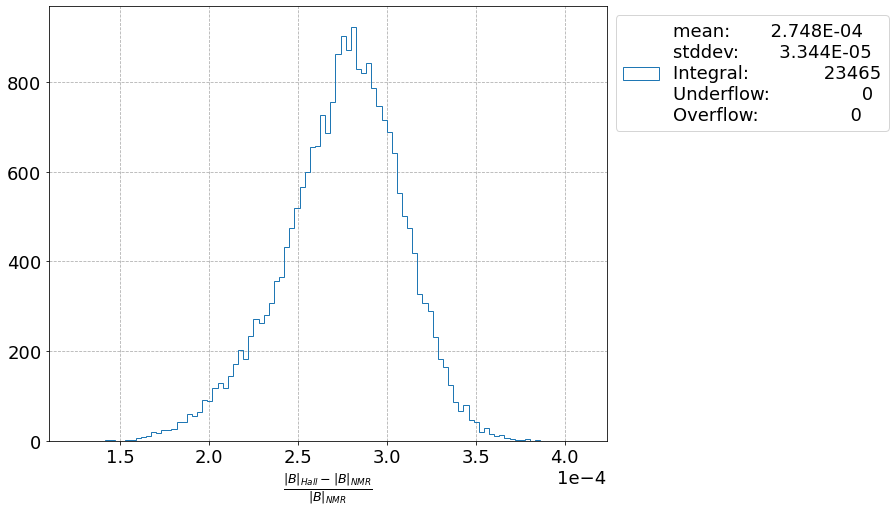

In [166]:
fig, ax = plt.subplots()

x = (df[f'{probe}_Cal_Bmag']-df['B_Hall_NMR'])/df['B_Hall_NMR']
xmi = np.min(x)
xma = np.max(x)
xra = xma-xmi
bins = np.linspace(xmi-0.05*xra, xma+0.05*xra, 100)

ax.hist(x, histtype='step', bins=bins, label=get_label(x, bins=bins));

ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

ax.set_xlabel(r'$\frac{|B|_{Hall} - |B|_{NMR}}{|B|_{NMR}}$');
ax.legend(loc='upper left', bbox_to_anchor=(1.0,1.0));

### Voltage Function

In [167]:
def Hall_Cal_B_gen_v1(axis0, axis1, **params):
    Bmax = params['Bmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    frac_B = np.dot(norm_B_rot, norm_Hall)
    B_meas = Bmax * frac_B
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, frac_B
    else:
        return B_meas

In [168]:
# B aligned perfectly with Kinematic plate
params = {
    'Bmax': 1.0, # ~2e6
    'verbose': 0,
    'theta': np.radians(2.),
    #'phi': np.radians(45.),
    'phi': np.radians(0.),
#     'phi': np.radians(180.),
    'alpha': 0.,
    'beta': 0.
}

In [169]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

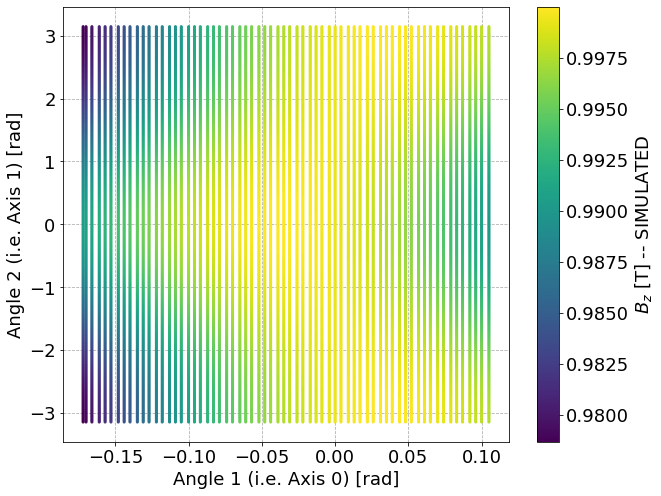

In [170]:
Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

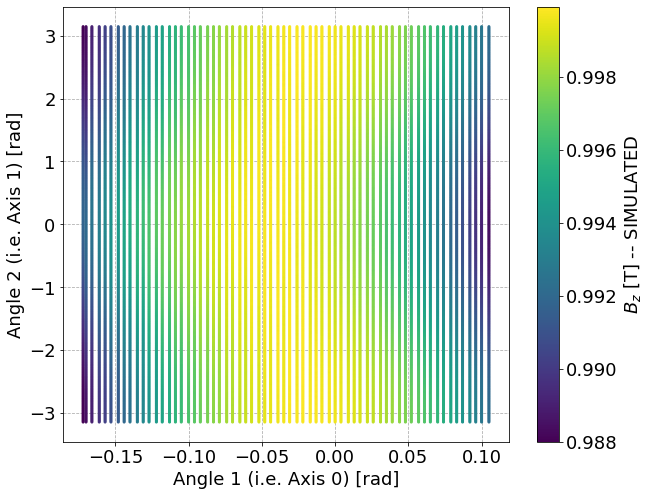

In [171]:
Bs = df['Cal_Z']

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

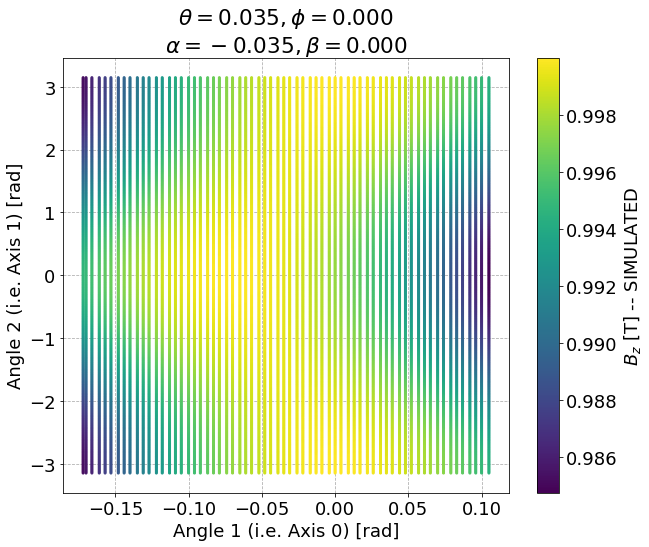

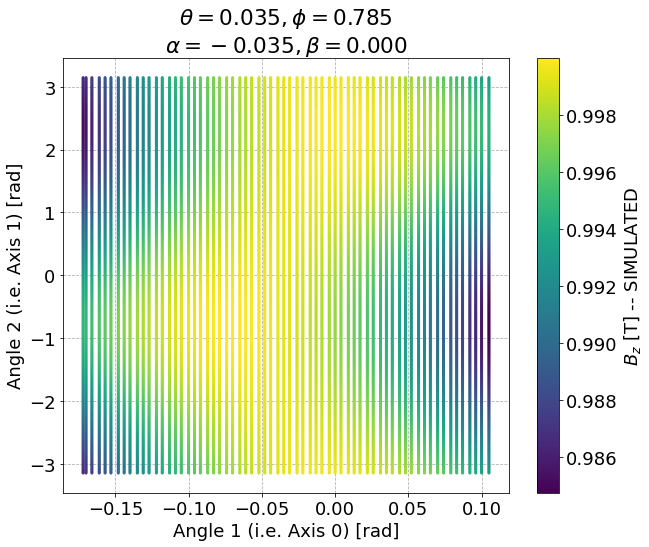

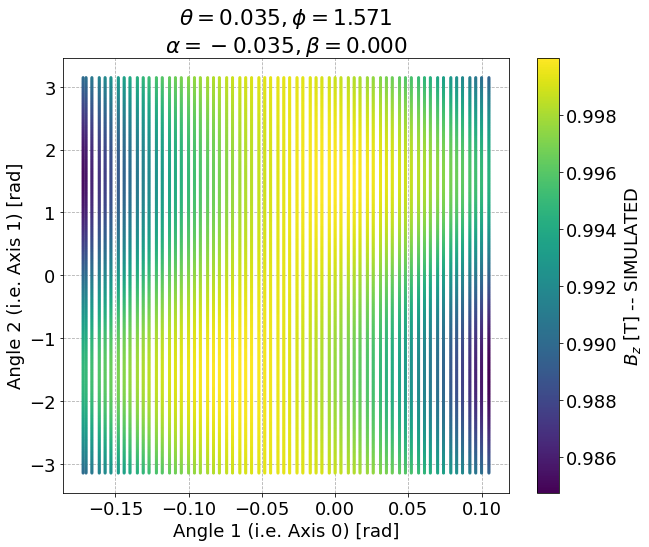

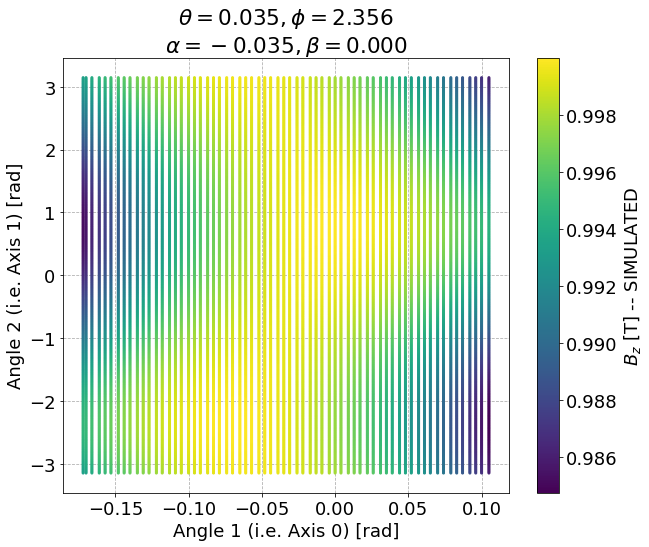

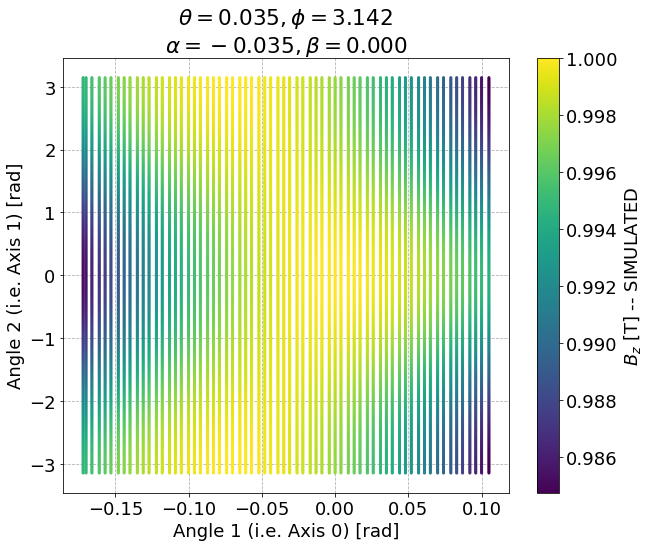

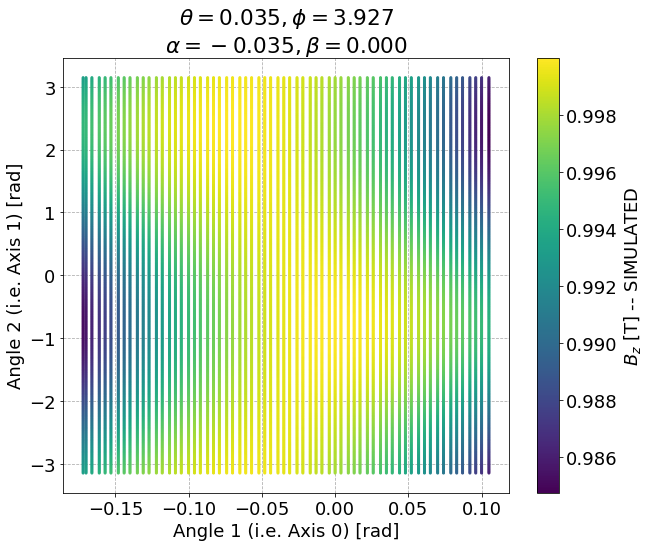

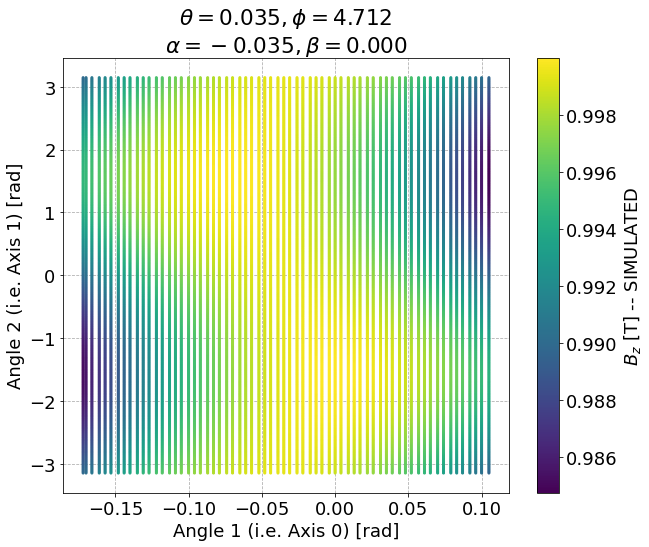

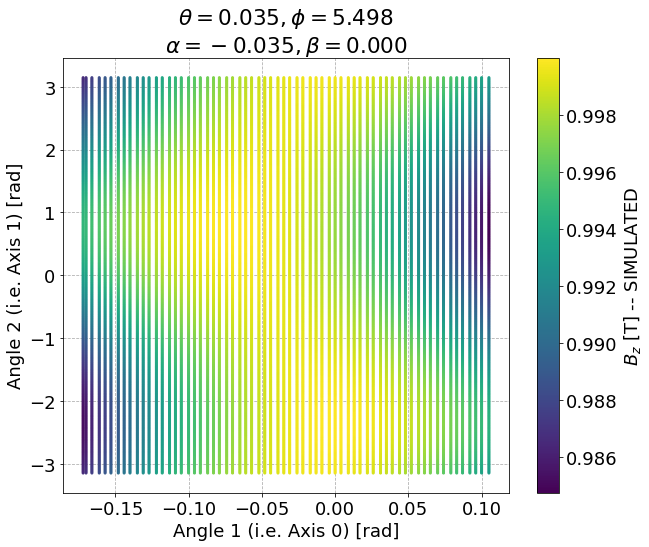

In [172]:
# B aligned perfectly with Kinematic plate
# does phi change anything, or is it only theta that matters?
phis = np.arange(0., 360., 45.)
# phis = [0., 45., 60., 90., 1]
for phi in phis:
    params = {
        'Bmax': 1.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(2.),
#         'theta': np.pi,
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.radians(phi),
        'alpha': np.radians(-2.),
        'beta': 0.
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
    cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

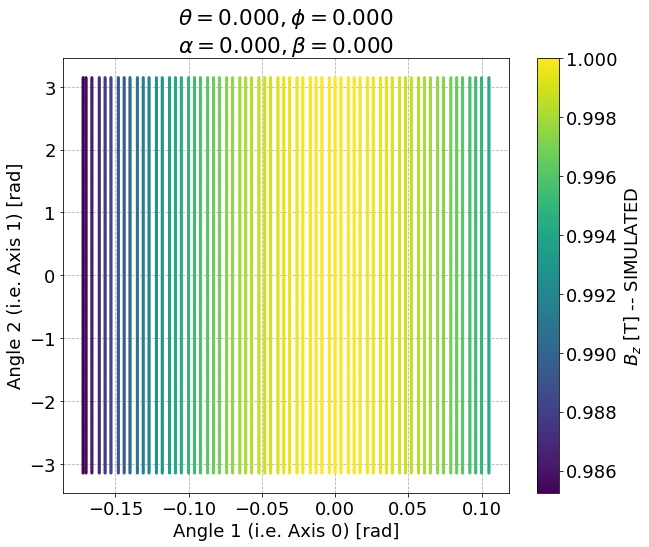

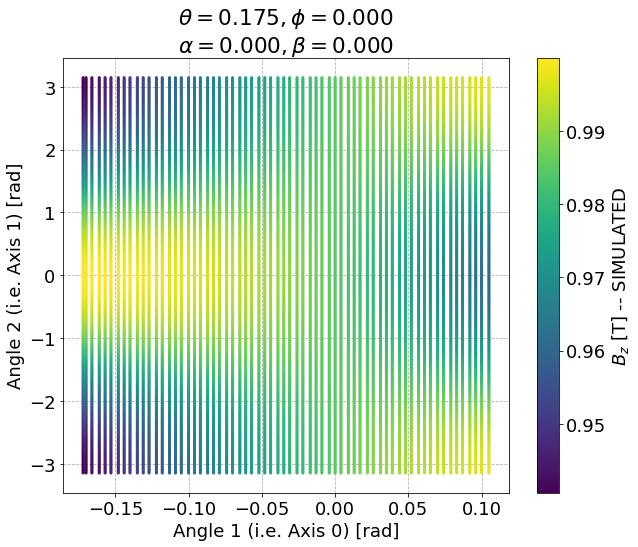

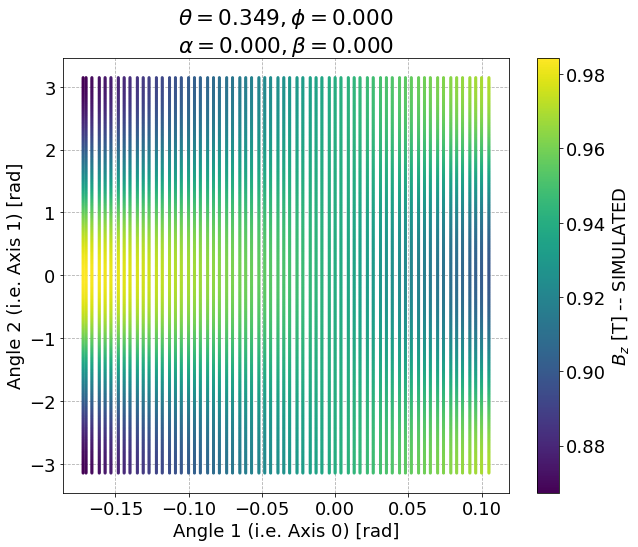

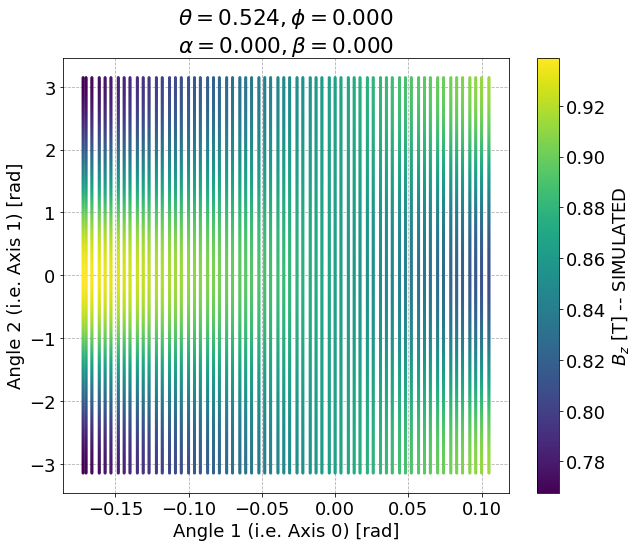

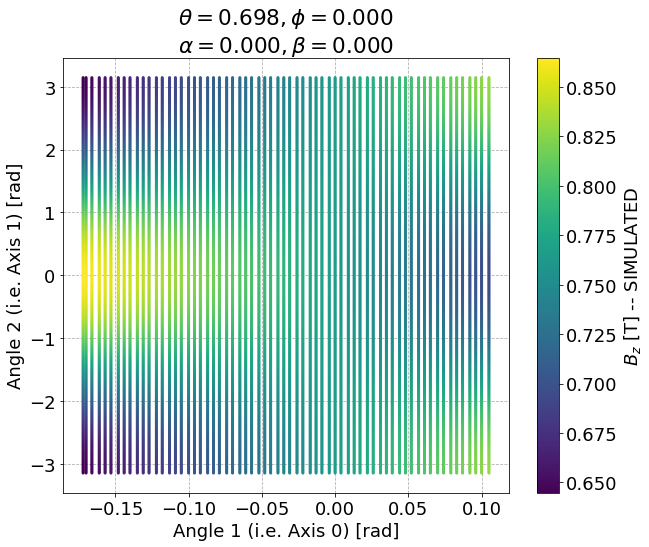

...

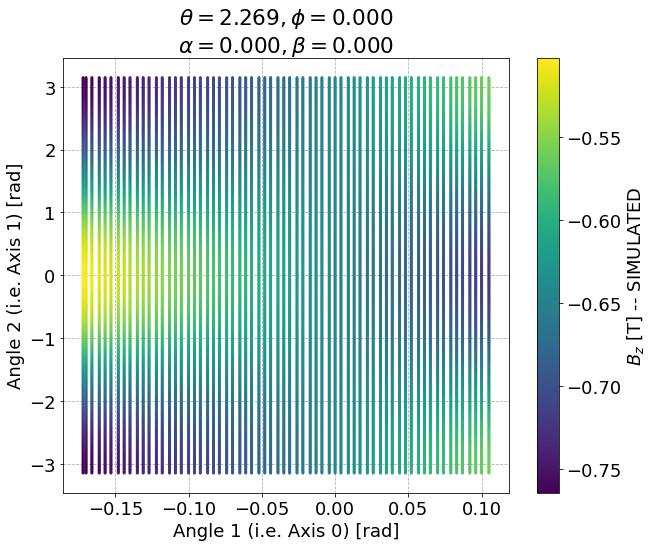

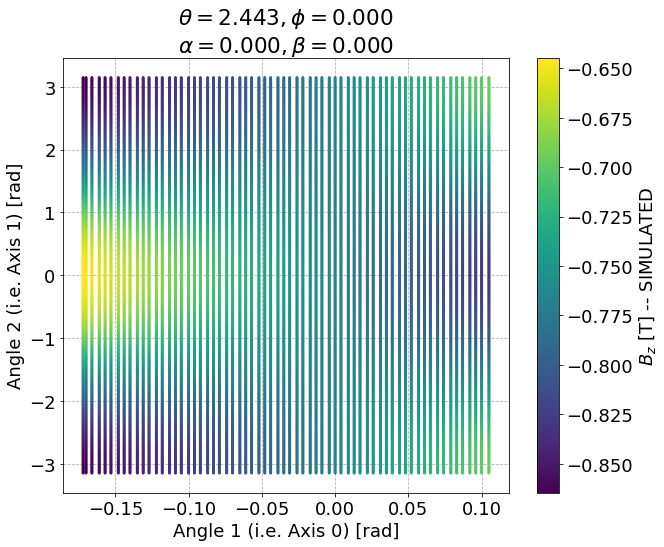

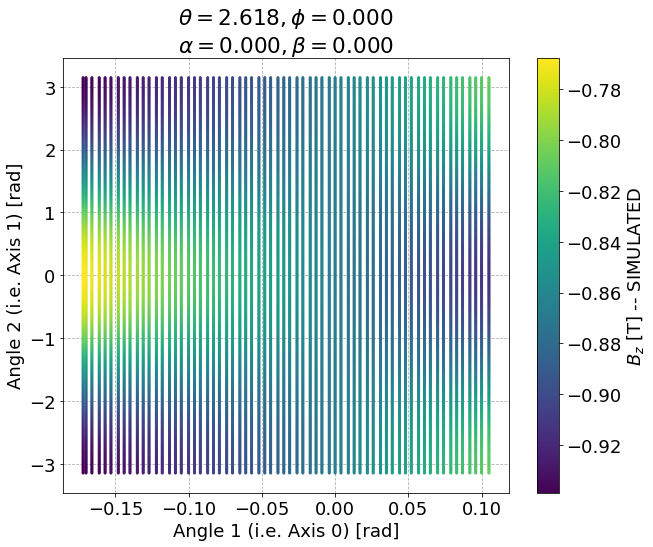

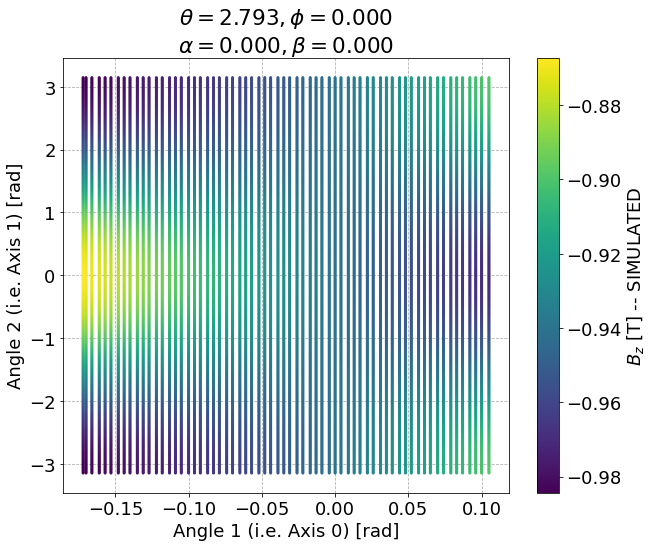

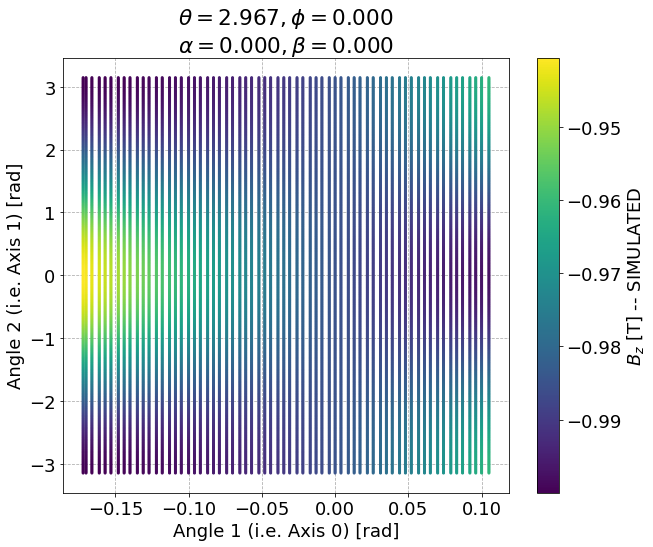

In [173]:
# B aligned perfectly with Kinematic plate
# theta dependence (phi = 0)
thetas = np.arange(0., 180., 10.)
# phis = [0., 45., 60., 90., 1]
for theta in thetas:
    params = {
        'Bmax': 1.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(theta),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': 0.,
        'alpha': 0.,
        'beta': 0.
    }
    ax0s = np.unique(np.round(a1, 3))
    ax1s = np.unique(np.round(a2, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
    cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

### Fitting

- See if fit for a single Hall element can constrain all four parameters.
- Since we can physically see the Hall elements, SmarAct in the magnet, approximate field direction, we can be smart about initial conditions and limits, if it turns out it there are many minima.
- If it is not possible, may need to combine Hall elements, or combine measurements from different Hall probes (this would be a reason to do a second Hall probe angular scan ASAP).

In [174]:
ax0s = np.unique(np.round(a1, 3))
ax1s = np.unique(np.round(a2, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [175]:
# generate data, with noise
B0 = 1.0
sigma = 1e-4 #2.8e3
params_true = {
        'Bmax': B0, # ~2e6
        'verbose': 0,
        'theta': np.random.uniform(low=0., high=np.pi),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.random.uniform(low=-np.pi, high=np.pi),
        'alpha': np.random.uniform(low=0., high=np.radians(12.)),
        'beta': np.random.uniform(low=-np.pi, high=np.pi)
}
Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params_true) for a0, a1 in zip(A0.flatten(), A1.flatten())])
Bs_meas = Bs + np.random.normal(loc=0, scale=sigma, size=len(Bs)) # ~0.1% noise

In [176]:
params_true

{'Bmax': 1.0,
 'verbose': 0,
 'theta': 0.5238511267111048,
 'phi': 2.913838149601073,
 'alpha': 0.1724262577056057,
 'beta': 0.2671212726827932}

In [177]:
Bs, Bs_meas

(array([0.97242585, 0.97347309, 0.9744153 , ..., 0.88712991, 0.88763364,
        0.88815935]),
 array([0.97256024, 0.973297  , 0.97443155, ..., 0.88709352, 0.88753647,
        0.88796387]))

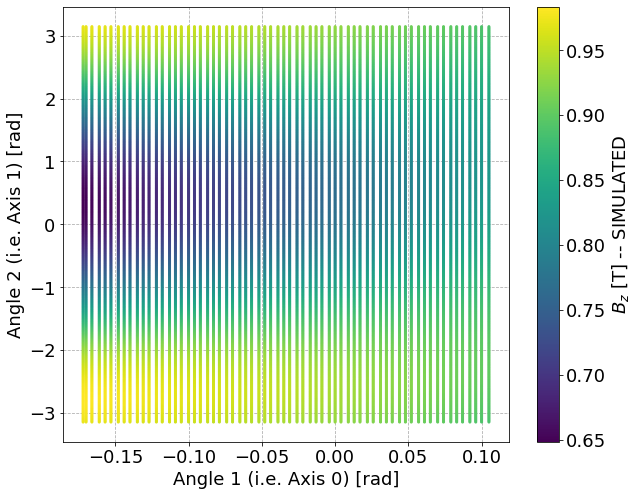

In [178]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

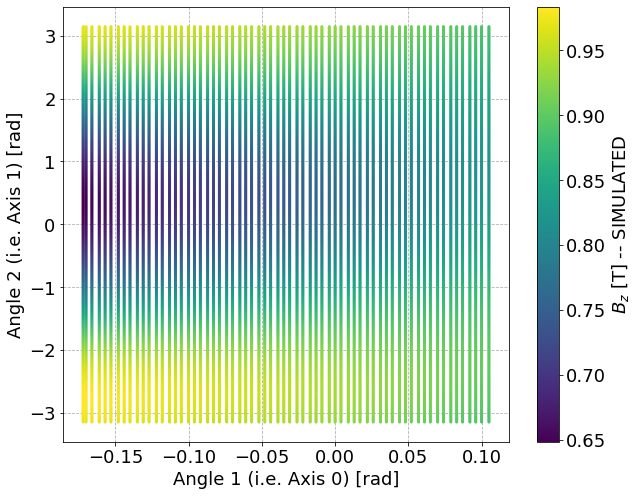

In [179]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [180]:
# fit!
model = lm.Model(Hall_Cal_B_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Bmax', value=B0, vary=False)
params.add('Bmax', value=B0, vary=True)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
# run fit
result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma*np.ones_like(Bs_meas)), scale_covar=False)

In [181]:
B0

1.0

In [182]:
result

In [183]:
params_true

{'Bmax': 1.0,
 'verbose': 0,
 'theta': 0.5238511267111048,
 'phi': 2.913838149601073,
 'alpha': 0.1724262577056057,
 'beta': 0.2671212726827932}

### Fit on real data!

In [184]:
B0 = df[f'Cal_Z'].abs().max()

In [185]:
B0

0.99992085

In [186]:
sigma_est = 3e-5
# sigma_est = 1e-4
# sigma_est = 1e-3
coord = 'Z'
# coord = 'X'
# coord = 'Y'
B0 = df[f'Cal_{coord}'].abs().max()
Bs_meas = df[f'Cal_{coord}'].values
# fit!
model = lm.Model(Hall_Cal_B_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
params.add('Bmax', value=B0, vary=True)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0. - np.pi/4, max=np.pi + np.pi/4)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=np.radians(-4.), max=np.radians(12.))
params.add('beta', value=0., min=-np.pi - np.pi/4, max=np.pi + np.pi/4, vary=True)
# best fit alpha and beta
# params.add('alpha', value=0.03240273, vary=False)
# params.add('beta', value=-3.14159265, vary=False)
# phi for X (really Y)
if coord == 'X':
    params.add('phi', value=-np.pi/2, vary=True, min=-np.pi/2 + np.radians(-10), max=-np.pi/2 + np.radians(10))
# phi for Y (really X)
if coord == 'Y':
    params.add('phi', value=0., vary=True, min=np.radians(-10), max=np.radians(10))

# run fit
result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)

In [187]:
result

In [188]:
np.degrees(0.011)

0.6302535746439055

In [189]:
def normalize_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arctan2(np.sin(angle_rad), np.cos(angle_rad)))
    else:
        return np.arctan2(np.sin(angle), np.cos(angle))

def normalize_polar_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arccos(np.cos(angle_rad)))
    else:
        return np.arccos(np.cos(angle))

In [190]:
for k in result.params.keys():
    print(k, result.params[k].value, normalize_angle(result.params[k].value), normalize_polar_angle(result.params[k].value))

Bmax 0.99979482717379 0.99979482717379 0.99979482717379
verbose 0.0 0.0 0.0
theta 0.013557509514601662 0.013557509514601662 0.013557509514598585
phi -0.0040503076146531924 -0.0040503076146531924 0.0040503076146464045
alpha -0.03238038389147315 -0.03238038389147315 0.03238038389147233
beta -0.0040083015512970555 -0.0040083015512970555 0.004008301551305286


In [191]:
if not np.isclose(normalize_angle(result.params['theta'].value), normalize_polar_angle(result.params['theta'].value)):
    print('Phi flipped')
    print(f'Phi0: {result.params["phi"].value}, Phi0 + pi: {normalize_angle(result.params["phi"].value+np.pi)}')

In [192]:
if not np.isclose(normalize_angle(result.params['alpha'].value), normalize_polar_angle(result.params['alpha'].value)):
    print('Beta flipped')
    print(f'Beta0: {result.params["beta"].value}, Beta0 + pi: {normalize_angle(result.params["beta"].value+np.pi)}')

Beta flipped
Beta0: -0.0040083015512970555, Beta0 + pi: 3.137584352038496


In [193]:
np.degrees(result.params['theta'])

0.7767880758951325

In [194]:
np.degrees(result.params['phi'])

-0.23206553204932773

In [195]:
np.degrees(result.params['alpha'])

-1.8552593359948082

In [196]:
np.degrees(result.params['beta'])

-0.22965876190506193

In [197]:
result.best_fit

array([0.98808851, 0.98808864, 0.98808931, ..., 0.99213884, 0.99213976,
       0.99214015])

In [198]:
# plots!
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [199]:
Bmin = np.min([np.min(df[f'Cal_{coord}']), np.min(result.best_fit)])
Bmax = np.max([np.max(df[f'Cal_{coord}']), np.max(result.best_fit)])

In [200]:
Bmin, Bmax

(0.987992161, 0.99992085)

Text(0.5, 1.0, 'Best Fit Values: \n$\\theta = 0.014,\\ \\phi = -0.004$, $\\alpha = -0.032,\\ \\beta = -0.004$')

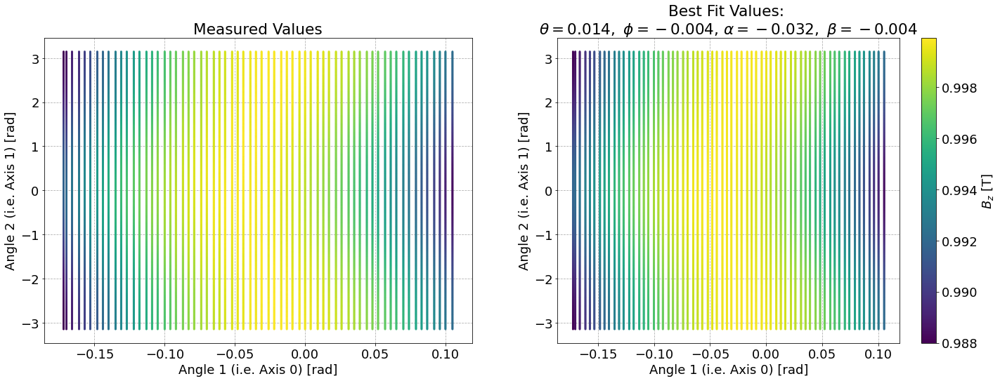

In [201]:
# data, fit
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))
cmap = cm.get_cmap('viridis')
normalizer = Normalize(Bmin, Bmax)
im = cm.ScalarMappable(norm=normalizer)
sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

cb = fig.colorbar(im, label=r'$B_z$ [T]')

axs[0].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[0].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[0].set_title('Measured Values')
axs[1].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[1].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[1].set_title('Best Fit Values: \n'+
                 rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
                 rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

Text(0.5, 1.0, 'Measured Values - Best Fit Values: \n$\\theta = 0.014,\\ \\phi = -0.004$, $\\alpha = -0.032,\\ \\beta = -0.004$')

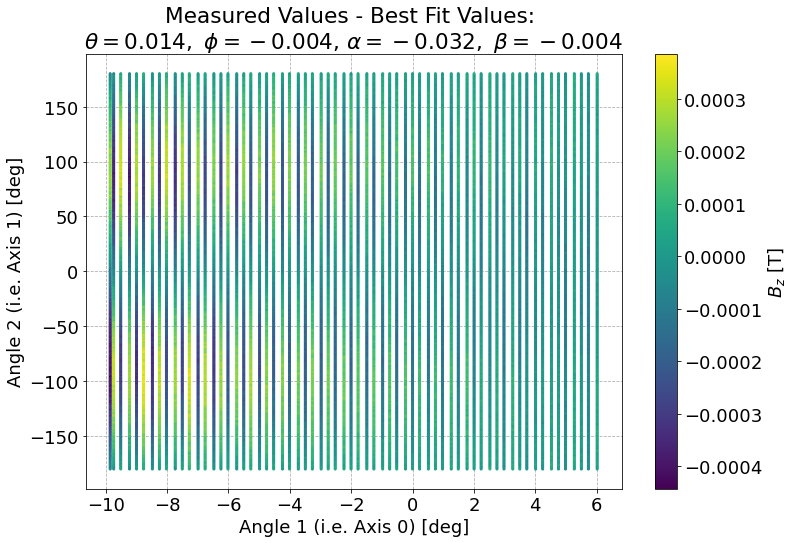

In [204]:
# data - fit
fig, ax = plt.subplots(figsize=(12, 8))
cmap = cm.get_cmap('viridis')
# normalizer = Normalize(Bmin, Bmax)
# im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = ax.scatter(np.degrees(A0.flatten()), np.degrees(A1.flatten()), c=Bs_meas-result.best_fit, s=4, cmap=cmap)#, norm=normalizer)

cb = fig.colorbar(sc, label=r'$B_z$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [deg]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [deg]')
ax.set_title('Measured Values - Best Fit Values: \n'+
             rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
             rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

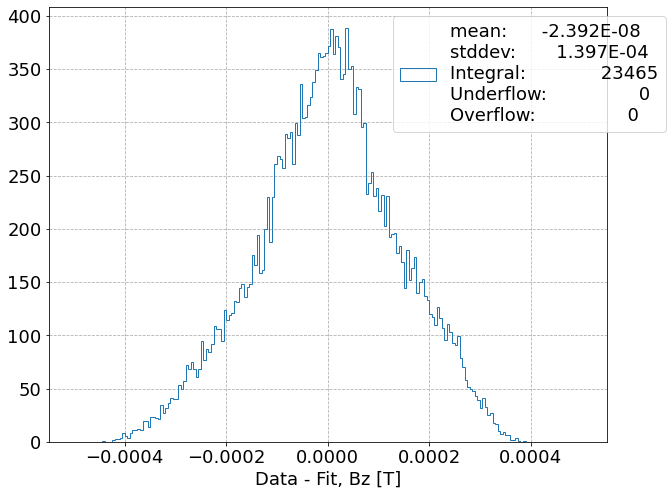

In [208]:
# hist
fig, ax = plt.subplots()

bins = np.arange(-5e-4, 5.05e-4, 5e-6)

ax.hist(Bs_meas-result.best_fit, bins=bins, histtype='step', label=get_label(Bs_meas-result.best_fit, bins))

ax.set_xlabel('Data - Fit, Bz [T]')

ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df['NMR [T]'], df[f'{probe}_Cal_Bmag'], s=1)

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df.index, df[f'{probe}_Cal_Bmag']-df['NMR [T]'], s=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist((df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]'], histtype='step', bins=100);

In [ ]:
res_rel = (df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]']
res_rel.mean(), res_rel.std()

In [ ]:
# check NMR and temp stability
for col in ['NMR [T]', f'{probe}_Cal_T']:
    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=df[col], s=4);
    cb = fig.colorbar(sc, label=col)

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
result.params['theta'].value

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Bs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit');

In [ ]:
# data / fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Bs_meas / result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$B_{z, meas.} / B_{z, fit}$')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data / Fit');

In [ ]:
# histograms

In [ ]:
len(Bs_meas)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Bs_meas - result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data - Fit [T]')

In [ ]:
np.mean(Bs_meas - result.best_fit), np.std(Bs_meas - result.best_fit, ddof=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Bs_meas / result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data / Fit')

In [ ]:
np.mean(Bs_meas / result.best_fit), np.std(Bs_meas / result.best_fit, ddof=1)

# Convert from fitted params to $\theta, \phi$

In [ ]:
def B_Angles_Kinematic_from_SmarAct_v1(axis0, axis1, degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    #norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate theta, phi
    B_T = np.linalg.norm(norm_B_rot[:2])
    theta = np.arctan2(B_T, norm_B_rot[2])
    phi = np.arctan2(norm_B_rot[1], norm_B_rot[0])
    return theta, phi

# phi has not been fixed!
def B_Theta_Hall_Cal_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    theta = np.arccos(np.dot(norm_B_rot, norm_Hall))
    
    return theta

# pick an arbitrary phi
def B_Angles_Hall_Cal_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=degrees) # ok
    #rotHall = Rotation.from_euler('yz', angles=np.array([params['theta'].value, params['phi'].value]).T, degrees=False) # theta wrong
#     rotHall = Rotation.from_euler('yz', angles=np.array([-params['theta'].value, -params['phi'].value]).T, degrees=False) # theta ok, phi seems weird
    rotHall = Rotation.from_euler('ZY', angles=np.array([-params['phi'], -params['theta']]).T, degrees=False) # theta ok, phi seems weird
    norm_B_rot = rotHall.apply(rot.apply(norm_B))
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    #theta = np.arccos(np.dot(norm_B_rot, norm_Hall))
    B_T = np.linalg.norm(norm_B_rot[:2])
    theta = np.arctan2(B_T, norm_B_rot[2])
    phi = np.arctan2(norm_B_rot[1], norm_B_rot[0])
    
    return theta, phi

def Calc_Angle_Between_Cal_and_B(Cal_X, Cal_Y, Cal_Z, theta_B, phi_B):
    Cal_vec = np.array([Cal_X, Cal_Y, Cal_Z])
    Cal_vec_normed = Cal_vec / np.linalg.norm(Cal_vec)
    B_vec = np.array([np.sin(theta_B) * np.cos(phi_B), np.sin(theta_B) * np.sin(phi_B), np.cos(theta_B)])
    vec_dot = np.dot(Cal_vec_normed, B_vec)
    return np.arccos(vec_dot)
    

# Don't really need alpha, beta here. Leaving it as a reminder.
# doesn't work as intended
'''
# get alpha, beta from theta, phi (or SmarAct) -- Planar Hall Effect. Phi might need a phase here.
def B_alpha_beta_Hall_3_from_SmarAct_v1(axis0, axis1,  degrees=False, **params):
    theta, phi = B_Angles_Hall_3_from_SmarAct_v1(axis0, axis1, degrees=degrees, **params)
    B = 1.
    Bx = np.sin(theta) * np.cos(phi + params['phase_phi'])
    By = np.sin(theta) * np.sin(phi + params['phase_phi'])
    alpha = np.arccos(Bx / B)
    beta = np.arccos(By / B)
    
    return alpha, beta


# get alpha, beta from theta, phi -- Planar Hall Effect. Phi might need a phase here.
def B_alpha_beta_Hall_3_from_theta_phi_v1(theta, phi,  degrees=False, **params):
    if degrees:
        theta = np.radians(theta)
        phi = np.radians(phi)
    B = 1.
    Bx = np.sin(theta) * np.cos(phi + params['phase_phi'])
    By = np.sin(theta) * np.sin(phi + params['phase_phi'])
    alpha = np.arccos(Bx / B)
    beta = np.arccos(By / B)
    
    return alpha, beta
'''
pass;

In [ ]:
# theta and phi, kinematic plate
'''th_list = []
ph_list = []
for row in df.itertuples():
    th, ph = B_Angles_Kinematic_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'phi_B'] = ph_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df.loc[:, 'phi_B_deg'] = np.degrees(ph_list)'''
pass;

In [ ]:
# theta only, Hall element V3
th_list = []
for row in df.itertuples():
    th = B_Theta_Hall_Cal_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
th_list = np.array(th_list)
df.loc[:, 'theta_B'] = th_list
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)

In [ ]:
# theta and phi, Hall element V3, arbitrary phi!
phase_phi = -0.45 # FIXME! This should be fit somewhere...
th_list = []
ph_list = []
for row in df.itertuples():
    th, ph = B_Angles_Hall_Cal_from_SmarAct_v1(row.SmarAct_Meas_Angle_1, row.SmarAct_Meas_Angle_2, degrees=True, **result.params)
    th_list.append(th)
    ph_list.append(ph)
th_list = np.array(th_list)
ph_list = np.array(ph_list)
#th_list = normalize_polar_angle(np.array(th_list), degrees=False)
#ph_list = normalize_angle(np.array(ph_list), degrees=False)
df.loc[:, 'theta_B'] = th_list
# phase can set phi out of range, so normalize
df.loc[:, 'phi_B'] = normalize_angle(ph_list + phase_phi, degrees=False)
df.loc[:, 'theta_B_deg'] = np.degrees(th_list)
df.loc[:, 'phi_B_deg'] = np.degrees(ph_list)

In [ ]:
# angle between
delta_angle = np.array([Calc_Angle_Between_Cal_and_B(row.Cal_X, row.Cal_Y, row.Cal_Z, row.theta_B, row.phi_B) for row in df.itertuples()])
df.loc[:, 'delta_angle'] = delta_angle

In [ ]:
df['phi_B'].min()

In [ ]:
# cal

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'Cal_Theta'], s=1);
ax.plot([df['theta_B'].min(), df['theta_B'].max()], [df['theta_B'].min(), df['theta_B'].max()], 'r--');
ax.set_xlabel(r'$\theta$ [rad] (from SmarAct)')
ax.set_ylabel(r'$\theta$ [rad] (from $\vec{B}$, Bergsma)');

In [ ]:
phase = 0. #-0.45
fig, ax = plt.subplots()
ax.scatter(df['phi_B']+phase, df['Cal_Phi'], s=1);
ax.plot([df['phi_B'].min(), df['phi_B'].max()], [df['phi_B'].min(), df['phi_B'].max()], 'r--');
# ax.plot([df['phi_B'].min(), df['phi_B'].max()], [df['phi_B'].min()+2*np.pi, df['phi_B'].max()+2*np.pi], 'r--');

# ax.set_ylim([-4, 4])

ax.set_xlabel(r'$\phi$ [rad] (from SmarAct)')
ax.set_ylabel(r'$\phi$ [rad] (from $\vec{B}$, Bergsma)');

In [ ]:
# deltas

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'Cal_Theta'] - df['theta_B'], s=1);

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['phi_B'], df['Cal_Phi']-df['phi_B'], s=1);

In [ ]:
fig, ax = plt.subplots()

x = df['delta_angle']
xmi = np.min(x)
xma = np.max(x)
xra = xma-xmi
bins = np.linspace(xmi-0.05*xra, xma+0.05*xra, 100)

ax.hist(x, histtype='step', bins=bins, label=get_label(x, bins=bins));
ax.set_xlabel(r'$\Delta \omega$ [rad]');
ax.legend(loc='upper left', bbox_to_anchor=(1.0,1.0));

In [ ]:
# delta angle
fig, ax = plt.subplots()

ax.scatter(df.index, df['delta_angle'], s=1);

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df['theta_B'], df['delta_angle'], s=1);

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df['phi_B'], df['delta_angle'], s=1);

- **STOPPED HERE. Not entirely sure how to interpret this. 07/13/22 17:11**

In [ ]:
# plot expected and actual field components here!

In [ ]:
df.loc[:, 'Bx_exp'] = df.loc[:, 'NMR [T]'] * np.sin(df.loc[:,'theta_B'])*np.cos(df.loc[:,'phi_B'])
df.loc[:, 'By_exp'] = df.loc[:, 'NMR [T]'] * np.sin(df.loc[:,'theta_B'])*np.sin(df.loc[:,'phi_B'])
df.loc[:, 'Bz_exp'] = df.loc[:, 'NMR [T]'] * np.cos(df.loc[:,'theta_B'])

In [ ]:
for i in ['x', 'y', 'z']:
    fig, ax = plt.subplots()

    ax.scatter(df.index, df[f'Cal_{i.upper()}'], s=1, label='Measured Field')
    ax.scatter(df.index, df[f'B{i}_exp'], s=1, label='Expected Field')
    
    ax.set_xlabel('Datetime')
    ax.set_ylabel(rf'$B_{i}$ [T]')

    ax.legend();

In [ ]:
for i in ['x', 'y', 'z']:
    fig, ax = plt.subplots()

    ax.scatter(df.index, df[f'Cal_{i.upper()}']-df[f'B{i}_exp'], s=1, label='Measured Field')
    
    ax.set_xlabel('Datetime')
    ax.set_ylabel(rf'$B_{i}$ (Measured - Expected) [T]')

    #ax.legend();

- Maybe X & Y will get better if $\phi$ phase is actually fit. Do that next!

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df.index, (df[f'Cal_X']-df[f'Bx_exp'])+(df[f'Cal_Y']-df[f'By_exp']), s=1, label='Measured Field')

ax.set_xlabel('Datetime')
ax.set_ylabel(r'$\Delta B_{x} + \Delta B_{y}$ (Measured - Expected) [T]')

#ax.legend();

In [ ]:
(df[f'Cal_X']-df[f'Bx_exp'])+(df[f'Cal_Y']-df[f'By_exp'])

In [ ]:
'x'.upper()

In [ ]:
##############

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df['theta_B'], df[f'Cal_Z'], s=1);
# ax.scatter(a2, r_th, s=1);

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(df['theta_B'], df['phi_B'], c=df[f'{probe}_Raw_Z'], s=4);
cb = fig.colorbar(sc, label=r'$V_3$ ("Z" Voltage) [$\mu$V]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
df.iloc[np.argmin(df['SmarAct_Meas_Angle_1'])]

# Which Data To Use

In [ ]:
result

In [ ]:
normalize_polar_angle(result.params['theta'], degrees=False)

In [ ]:
180 - np.degrees(normalize_polar_angle(result.params['theta'], degrees=False))

In [ ]:
np.degrees(result.params['alpha'])

In [ ]:
df.loc[:, 'a1'] = np.arctan2(np.sin(np.radians(df.SmarAct_Meas_Angle_1)), np.cos(np.radians(df.SmarAct_Meas_Angle_1)))
df.loc[:, 'a1_deg'] = np.degrees(df.loc[:, 'a1'])

In [ ]:
df.a1.describe()

In [ ]:
df.a1_deg.describe()

In [ ]:
# all
# df_ = df.copy()
# theta > 0
df_ = df.query('a1_deg > -2.').copy() # conservatively covers 0.

In [ ]:
len(df_), len(df)

In [ ]:
df_.theta_B_deg.describe()

In [ ]:
df.SmarAct_Meas_Angle_1

# Asides:

## Rotation Order / Intrinsic vs. Extrinsic

- Starting with vector in XY plane, at a 45 deg angle. First rotate about Y, 90 deg, then rotate about Z 180 deg. Should give --> (0, - 1/sqrt(2), -1/sqrt(2))
    - Doing only the Y rotation should give (0, 1/sqrt(2), -1/sqrt(2))
    - Doing only the Z rotation should give (-1/sqrt(2), 1/sqrt(2), 0)

In [ ]:
B_0 = np.array([1./2.**(0.5), 1./2.**(0.5), 0.])
B_0

In [ ]:
# single rotation
# rot = Rotation.from_euler('y', angles=np.array([90.]), degrees=True)
# rot = Rotation.from_euler('z', angles=np.array([90.]), degrees=True)
# both rotations
rot = Rotation.from_euler('yz', angles=np.array([90., 90.]), degrees=True) # ok
# rot = Rotation.from_euler('YZ', angles=np.array([90., 90.]), degrees=True) # BAD
# rot = Rotation.from_euler('zy', angles=np.array([90., 90.]), degrees=True) # BAD
# rot = Rotation.from_euler('ZY', angles=np.array([90., 90.]), degrees=True) # ok

In [ ]:
B_rot = rot.apply(B_0)

In [ ]:
B_rot

## Rotation with ND array

# OLD (To Go Through)

In [ ]:
Data

## Determine Probe Numbers

In [ ]:
(df_ == df).all().all()

## Probe on "left" of glass cube (V_2 = Raw_y)

In [ ]:
# HP "vertical", small end pointed towards ceiling

In [ ]:
360 - 25

In [ ]:
df['SmarAct_Meas_Angle_2'].unique()

In [ ]:
df_line = df[np.isclose(df['SmarAct_Meas_Angle_2'], 335., atol=1e-2, rtol=1e-2)]

In [ ]:
df_line

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_X'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Y'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Z'])

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_X'])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_Y'])
ax.scatter(df_line[f'{probe}_Raw_Y'], df_line[f'{probe}_Cal_Z'])

In [ ]:
# HP "horizontal", small end toward "right" (aka Zaber base)
# note don't have exact rotation, within 10 degrees on either end

In [ ]:
360 - 25 - 90

In [ ]:
#(360 - 25 + 90) % 360

In [ ]:
df['SmarAct_Meas_Angle_2'].unique()

In [ ]:
df_line = df[np.isclose(df['SmarAct_Meas_Angle_2'], 255., atol=1e-2, rtol=1e-2)]

In [ ]:
df_line

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_X'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Y'])
ax.scatter(df_line['SmarAct_Pattern_Angle_1'], df_line[f'{probe}_Raw_Z'])

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_X'])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_Y'])
ax.scatter(df_line[f'{probe}_Raw_X'], df_line[f'{probe}_Cal_Z'])

In [ ]:
fig, ax = plt.subplots()

# ax.scatter(df_line['SmarAct_Meas_Angle_1'], df_line[''])
ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_X'])
# ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_Y'])
# ax.scatter(df_line[f'{probe}_Raw_Z'], df_line[f'{probe}_Cal_Z'])

# Positions
- Match up with labels "H1", "H2", "H3" on pictures of green Hall probe card
- "H1" -> "Raw_X", etc.

- Mapping:
    - Raw Z --> -B_z (B_z = B_z on Big Propeller)
    - Raw Y --> B_x (B_x = B_phi on Big Propeller)
    - Raw X --> -B_y (B_y = B_r on Big Propeller)
    
- Bergsma (for comparison):
    - Raw Z --> -B_x
    - Raw Y --> B_y
    - Raw X --> -B_z

In [ ]:
probe

In [ ]:
from hallprobecalib.hpcplots import spherical_scatter3d

In [ ]:
# fig = spherical_scatter3d(np.radians(df['SmarAct_Meas_Angle_2']), np.radians(df['SmarAct_Meas_Angle_1']), df[f'{probe}_Raw_Z'])
fig = spherical_scatter3d(3*[df['SmarAct_Meas_Angle_2']], 3*[df['SmarAct_Meas_Angle_1']+2.], [df[f'{probe}_Raw_{i}'] for i in ['X', 'Y', 'Z']],
                         colors_list=['Blues', 'Hot', 'Viridis'])

In [ ]:
fig, ax = plt.subplots()

a0 = np.radians(df['SmarAct_Meas_Angle_1'])
a0 = np.array([i if i <= np.pi else i-2*np.pi for i in a0])

ax.scatter(np.degrees(a0), df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_2'])

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])

In [ ]:
def quad(theta, **params):
    return params['C_0'] + params['C_1'] * theta + params['C_2'] * theta**2

def mod_cos(theta, **params):
    return params['C_0'] + params['C_1'] * np.cos(params['C_2']*theta + params['C_3'])

In [ ]:
a1 = np.radians(df['SmarAct_Meas_Angle_1'])
a1 = np.array([i if i <= np.pi else i-2*np.pi for i in a1])
a2 = np.radians(df['SmarAct_Meas_Angle_2'])
a2 = np.array([i if i <= np.pi else i-2*np.pi for i in a2])
df['a1'] = a1
df['a2'] = a2

In [ ]:
df_ = df.sort_values(by='a1')

In [ ]:
std_V = 2e-5 * df_[f'{probe}_Raw_Z'].values

In [ ]:
# model = lm.Model(quad, independent_vars=['theta'])
model = lm.Model(mod_cos, independent_vars=['theta'])
params = lm.Parameters()
params.add('C_0', value=0, vary=False)
params.add('C_1', value=0, vary=True)
# params.add('C_2', value=0, vary=True)
params.add('C_2', value=1, min=0.1, max=2., vary=False)
params.add('C_3', value=0., min=-np.pi, max=np.pi, vary=True)
result = model.fit(df_[f'{probe}_Raw_Z'].values, theta=df_['a1'].values, params=params, weights=1/std_V)

In [ ]:
result

In [ ]:
np.degrees(result.params['C_3'])

In [ ]:
result.plot()

In [ ]:
lm

In [ ]:
res = result.residual

In [ ]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, res, c=df.a2)

In [ ]:
res / df[f'{probe}_Raw_Z']

In [ ]:
fig,ax =plt.subplots()
ax.hist(res / df[f'{probe}_Raw_Z'], bins=20, histtype='step');

In [ ]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df[f'{probe}_Cal_T'], res, c=df.a2)

In [ ]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, df[f'{probe}_Raw_Bmag'], c=df.a2)

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df.a2, df[f'{probe}_Raw_Bmag'], c=df.a1)

In [ ]:
fig, ax = plt.subplots()

#ax.scatter(df.seconds_delta, df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_1'])
ax.scatter(df.a1, df[f'{probe}_Cal_Bmag'], c=df.a2)

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df.a2, df[f'{probe}_Cal_Bmag'], c=df.a1)


In [ ]:
df[f'{probe}_Cal_Bmag'].describe()

In [ ]:
df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].describe()

In [ ]:
df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].mean() - 2e-4

In [ ]:
df[f'{probe}_Cal_Bmag'].mean() - (df_temp.query('`NMR [T]` > 0.1')['NMR [T]'].mean() - 2e-4)

# Bergsma Calibration

In [ ]:
## ADD THIS TO NOTES / MAIN CODE
df['Bz_Bergsma'] = df[f'{probe}_Cal_X']
df['By_Bergsma'] = df[f'{probe}_Cal_Z']
df['Bx_Bergsma'] = df[f'{probe}_Cal_Y']


In [ ]:
fig, ax = plt.subplots()

a0 = np.radians(df['SmarAct_Meas_Angle_1'])
a0 = np.array([i if i <= np.pi else i-2*np.pi for i in a0])

ax.scatter(np.degrees(a0), df[f'{probe}_Raw_Z'], c=df['SmarAct_Pattern_Angle_2'])